<div style="font-family: 'Segoe UI', Roboto, sans-serif; background:#f7faff; padding:40px; border-radius:18px; border:1px solid #e0e8f5;">
    <div style="text-align:center; margin-bottom:35px;">
        <h1 style="margin:0; font-size:34px; color:#1a3d7c; font-weight:700;">
            Term Project – Group 4
        </h1>
        <h2 style="margin-top:10px; font-size:22px; color:#3a5ea8;">
            Breast Cancer Prediction Using Machine Learning
        </h2>
    </div>
    <div style="background:white; padding:20px 25px; margin-bottom:25px; border-radius:14px; border:1px solid #dce3f2; box-shadow:0 2px 6px rgba(0,0,0,0.04);">
        <h3 style="color:#1a3d7c; font-size:20px; margin-bottom:10px;">🎯 Objective</h3>
        <p style="font-size:15px; color:#3b3b3b; line-height:1.55;">
            To design, train, and evaluate multiple machine learning models to identify the best-performing model for predicting whether a breast tumor is <strong>Malignant</strong> or <strong>Benign</strong>.
        </p>
    </div>
    <div style="background:white; padding:20px 25px; margin-bottom:25px; border-radius:14px; border:1px solid #dce3f2; box-shadow:0 2px 6px rgba(0,0,0,0.04);">
        <h3 style="color:#1a3d7c; font-size:20px; margin-bottom:10px;">📊 Dataset Used</h3>
        <p style="font-size:15px; color:#3b3b3b; line-height:1.55;">
            The dataset used is the <strong>University of Wisconsin Breast Cancer Diagnostic Dataset</strong>. Features are computed from <strong>diagnostic images of breast tissue samples</strong> and describe the <strong>characteristics of the cell nuclei</strong> present in the images.
        </p>
    </div>
    <div style="background:white; padding:20px 25px; border-radius:14px; border:1px solid #dce3f2; box-shadow:0 2px 6px rgba(0,0,0,0.04);">
        <h3 style="color:#1a3d7c; font-size:20px; margin-bottom:15px;">👥 Group Members</h3>
        <ul style="font-size:15px; color:#3b3b3b; line-height:1.6; margin-left:-10px;">
            <li>Rahulkumar Ajani</li>
            <li>Elba Gomez Navas</li>
            <li>Ankita Nayak</li>
            <li>Ashley Fergusson</li>
            <li>Nikola Stojanovic</li>            
        </ul>
    </div>
</div>


### ⚙️ Initial Setup

> Import all necessary libraries and configure the environment before starting data analysis and modeling.

In [1]:
# =============================================================================================
# Library Imports for the Project
# =============================================================================================

# ---------------------------------------------------------------------------------------------
# 0. OS / System Utilities
# ---------------------------------------------------------------------------------------------
import os
import sys
import tarfile
import subprocess
import importlib.util
from six.moves import urllib

# ---------------------------------------------------------------------------------------------
# 1. Warnings Control
# ---------------------------------------------------------------------------------------------
import warnings
warnings.filterwarnings("ignore", message="^internal gelsd")

# ---------------------------------------------------------------------------------------------
# 2. Data Handling & Scientific Computing
# ---------------------------------------------------------------------------------------------
import pandas as pd
import numpy as np
import requests
from scipy import stats
from scipy.interpolate import griddata

# ---------------------------------------------------------------------------------------------
# 3. Machine Learning — Preprocessing, Models, Scoring, Evaluation
# ---------------------------------------------------------------------------------------------
from sklearn.model_selection import (
    train_test_split, StratifiedKFold, cross_validate, GridSearchCV
)
from sklearn.preprocessing import (
    StandardScaler, RobustScaler, LabelEncoder, MinMaxScaler
)
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.calibration import calibration_curve
from sklearn.decomposition import PCA

# ML Models
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import (
    RandomForestClassifier, GradientBoostingClassifier, VotingClassifier
)
from sklearn.neural_network import MLPClassifier

from xgboost import XGBClassifier
from lightgbm import LGBMClassifier

# Metrics
from sklearn.metrics import (
    accuracy_score, precision_score, recall_score, f1_score,
    roc_curve, precision_recall_curve, roc_auc_score,
    make_scorer, confusion_matrix
)

import time # Will be used to measure training time for models

# ---------------------------------------------------------------------------------------------
# 4. Plotting & Visualization
# ---------------------------------------------------------------------------------------------
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go

# Inline plotting for Jupyter
%matplotlib inline

# ---------------------------------------------------------------------------------------------
# 5. Check & Install External Packages (XGBoost, SHAP)
# ---------------------------------------------------------------------------------------------
def ensure_installed(package_name):
    if importlib.util.find_spec(package_name) is None:
        print(f"{package_name} not found — installing now…")
        subprocess.check_call([sys.executable, "-m", "pip", "install", package_name])
        print(f"{package_name} successfully installed!")
    else:
        print(f"{package_name} is already installed!")

# Install checks
ensure_installed("xgboost")
ensure_installed("shap")

import shap
shap.initjs()

# ---------------------------------------------------------------------------------------------
# Ready!
# ---------------------------------------------------------------------------------------------
print("---------------------------------------------------------------------------------------------")
print("All libraries loaded. Environment ready for the project!")
print("---------------------------------------------------------------------------------------------")


xgboost is already installed!
shap is already installed!


---------------------------------------------------------------------------------------------
All libraries loaded. Environment ready for the project!
---------------------------------------------------------------------------------------------


### ⚡ Initial Data Load

> Create project folder, download the dataset from GitHub if not already present, and load it into a Pandas DataFrame.

In [2]:
# ---------------------------------------------------------------------------------------------
# Initial Data Load for Project
# ---------------------------------------------------------------------------------------------

# Define GitHub CSV URL
data_url = "https://raw.githubusercontent.com/rahulajani/ml/main/project_data.csv"

# Define local folder to store project data
local_path = "project_data"

def fetch_project_data(data_url, local_path):
    
    # Create folder if needed and download CSV from GitHub if it doesn't exist.
    
    print(f"Loading data from: {data_url} to local folder: {local_path} ...")
    
    if not os.path.isdir(local_path):
        os.makedirs(local_path)
        print(f"Created local folder: {local_path}")
    
    csv_path = os.path.join(local_path, "project_data.csv")
    
    if not os.path.isfile(csv_path):
        r = requests.get(data_url)
        with open(csv_path, "wb") as f:
            f.write(r.content)
        print(f"Download complete.")
    else:
        print(f"File already exists locally.")

def load_project_data(local_path):
    
    # Load the CSV file into a Pandas DataFrame.
    
    csv_path = os.path.join(local_path, "project_data.csv")
    return pd.read_csv(csv_path)

# Fetch and load data
fetch_project_data(data_url, local_path)
df = load_project_data(local_path)

print(f"---------------------------------------------------------------------------------------------")
print(f"Project data is loaded and ready. ")
print(f"---------------------------------------------------------------------------------------------")

# Display first 10 rows
df.head(10)

Loading data from: https://raw.githubusercontent.com/rahulajani/ml/main/project_data.csv to local folder: project_data ...
File already exists locally.
---------------------------------------------------------------------------------------------
Project data is loaded and ready. 
---------------------------------------------------------------------------------------------


,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,Unnamed: 32
0,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.30010,0.14710,...,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890,NaN
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.08690,0.07017,...,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902,NaN
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.19740,0.12790,...,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758,NaN
3,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.24140,0.10520,...,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300,NaN
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.19800,0.10430,...,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678,NaN
5,843786,M,12.45,15.70,82.57,477.1,0.12780,0.17000,0.15780,0.08089,...,23.75,103.40,741.6,0.1791,0.5249,0.5355,0.1741,0.3985,0.12440,NaN
6,844359,M,18.25,19.98,119.60,1040.0,0.09463,0.10900,0.11270,0.07400,...,27.66,153.20,1606.0,0.1442,0.2576,0.3784,0.1932,0.3063,0.08368,NaN
7,84458202,M,13.71,20.83,90.20,577.9,0.11890,0.16450,0.09366,0.05985,...,28.14,110.60,897.0,0.1654,0.3682,0.2678,0.1556,0.3196,0.11510,NaN
8,844981,M,13.00,21.82,87.50,519.8,0.12730,0.19320,0.18590,0.09353,...,30.73,106.20,739.3,0.1703,0.5401,0.5390,0.2060,0.4378,0.10720,NaN
9,84501001,M,12.46,24.04,83.97,475.9,0.11860,0.23960,0.22730,0.08543,...,40.68,97.65,711.4,0.1853,1.0580,1.1050,0.2210,0.4366,0.20750,NaN


#### 👀 Observations

> The column **`id`** is an identifier and does not contain predictive information, so it will be excluded from modeling.
>
> The column **`Unnamed:32`** appears to consist entirely of missing values. We will verify this and **remove the column** if it contains no useful data.

In [3]:
# ---------------------------------------------------------------------------------------------
# Checking if the column Unnamed:32 has any data?
# ---------------------------------------------------------------------------------------------
# Total rows in the dataframe
total_rows = len(df)

# Count rows where column 'Unnamed: 32' has null values
null_rows = df['Unnamed: 32'].isnull().sum()

print("Total rows in the data frame are:", total_rows)
print("Rows with null in 'Unnamed: 32' are:", null_rows)

Total rows in the data frame are: 569
Rows with null in 'Unnamed: 32' are: 569


#### 📌 Conclusion

> The column **`Unnamed:32`** contains no valid data across all 569 records.  
> Therefore, it will be **removed** from the dataset as it provides no value for analysis or modeling.

### 🔀 Train/Test Data Split & Feature/Target Separation

> Split the dataset into training and test sets **to ensure** that **exploratory data analysis, feature engineering, and model training** are performed **only on the training data**, while the test set remains unseen for unbiased evaluation of model performance.

In [4]:
# ---------------------------------------------------------------------------------------------
# Train/Test Split and Feature/Target Separation
# ---------------------------------------------------------------------------------------------

# Define the target variable
target = 'diagnosis'

# Split 70% train / 30% test with stratification on the target
train_df, test_df = train_test_split(
    df,
    test_size=0.3,
    random_state=42,       
    stratify=df[target]    # preserves proportion of classes 'B' and 'M'
)

# Separate features and target for training set, at the same time drop 'id' and 'Unnamed:32'
X_train = train_df.drop(columns=[target, 'id', 'Unnamed: 32'], errors='ignore')
y_train = train_df[target]

# Repeat the same as above for test data as well. 
X_test = test_df.drop(columns=[target, 'id', 'Unnamed: 32'], errors='ignore')
y_test = test_df[target]

# Confirm split
print(f"Training features shape: {X_train.shape}, Training target shape: {y_train.shape}")
print(f"---------------------------------------------------------------------------------------------")
print(f"Test features shape: {X_test.shape}, Test target shape: {y_test.shape}")
print(f"---------------------------------------------------------------------------------------------")

# Check class distribution in train and test
print(f"\nClass distribution in training set:")
print(y_train.value_counts(normalize=True))
print(f"---------------------------------------------------------------------------------------------")
print(f"\nClass distribution in test set:")
print(y_test.value_counts(normalize=True))

print(f"---------------------------------------------------------------------------------------------")
print(f"Irrelevant columns removed. Targer separated. Train 70% - test 30% split done. ")
print(f"---------------------------------------------------------------------------------------------")


Training features shape: (398, 30), Training target shape: (398,)
---------------------------------------------------------------------------------------------
Test features shape: (171, 30), Test target shape: (171,)
---------------------------------------------------------------------------------------------

Class distribution in training set:
diagnosis
B    0.628141
M    0.371859
Name: proportion, dtype: float64
---------------------------------------------------------------------------------------------

Class distribution in test set:
diagnosis
B    0.625731
M    0.374269
Name: proportion, dtype: float64
---------------------------------------------------------------------------------------------
Irrelevant columns removed. Targer separated. Train 70% - test 30% split done. 
---------------------------------------------------------------------------------------------


### 📊 Statistical Characteristics Exploration: Training Data Only

> Examine the statistical properties of the dataset such as **data shape**, **data type** in different columns, **missing values** count for various columns, **unique values** from categorical columns, **target distribution** to better understand the data before modeling.

In [5]:
# ---------------------------------------------------------------------------------------------
# Statistical Characteristics Exploration (Training Data Only)
# ---------------------------------------------------------------------------------------------

# Dataset Shape
print(f"Training Dataset Shape is as follows: {X_train.shape}")
print(f"---------------------------------------------------------------------------------------------")

# Columns and Data Types
print(f"\nColumns and Data Types are:")
print(X_train.dtypes)
print(f"---------------------------------------------------------------------------------------------")

# Missing Values
print(f"\nMissing Values per Column in Training Set are as follows:")
print(X_train.isnull().sum())
print(f"---------------------------------------------------------------------------------------------")

# Target Variable Distribution (from training labels)
print(f"\nTarget Variable ('{target}') Counts in Training Set:")
print(y_train.value_counts())
print(f"\nTarget Variable ('{target}') Proportions in Training Set:")
print(y_train.value_counts(normalize=True))
print(f"---------------------------------------------------------------------------------------------")

# Unique Values for Categorical Columns (non-numeric)
cat_cols = X_train.select_dtypes(exclude=['int64', 'float64']).columns.tolist()
if cat_cols:
    print(f"\nCategorical Columns in Training Set and Unique Values are:")
    for col in cat_cols:
        print(f"{col}: {X_train[col].nunique()} unique values")

Training Dataset Shape is as follows: (398, 30)
---------------------------------------------------------------------------------------------

Columns and Data Types are:
radius_mean                float64
texture_mean               float64
perimeter_mean             float64
area_mean                  float64
smoothness_mean            float64
compactness_mean           float64
concavity_mean             float64
concave points_mean        float64
symmetry_mean              float64
fractal_dimension_mean     float64
radius_se                  float64
texture_se                 float64
perimeter_se               float64
area_se                    float64
smoothness_se              float64
compactness_se             float64
concavity_se               float64
concave points_se          float64
symmetry_se                float64
fractal_dimension_se       float64
radius_worst               float64
texture_worst              float64
perimeter_worst            float64
area_worst              

#### 👀 Observations
> All features are **numeric**, and there are **no missing values** in the dataset.
>
> The target variable, **diagnosis**, is **categorical** with two classes:
> - **B** → Benign
> - **M** → Malignant
>
> This confirms that the dataset is **clean** and suitable for supervised binary classification without requiring imputation for missing data.

#### 📋 Descriptive Statistics of Training Features

> Display comprehensive statistics of the training dataset features, including measures of central tendency, dispersion, and range, to understand feature distributions before modeling.

In [6]:
# ---------------------------------------------------------------------------------------------
# Generate descriptive statistics for training features
# ---------------------------------------------------------------------------------------------
# Use X_train (features only)
feature_cols = X_train.columns  # Note that X_train already excludes target

# Prepare list to collect stats
stats_list = []

for col in feature_cols:
    col_data = X_train[col]
    
    stats_list.append({
        "Feature": col,
        "Count": col_data.count(),
        "Mean": col_data.mean(),
        "Std": col_data.std(),
        "Median": col_data.median(),
        "Mode": col_data.mode()[0] if not col_data.mode().empty else None,
        "25%": col_data.quantile(0.25),
        "50%": col_data.quantile(0.50),
        "75%": col_data.quantile(0.75),
        "Min": col_data.min(),
        "Max": col_data.max(),
        "Range": col_data.max() - col_data.min()
    })

# Convert to DataFrame
descriptive_stats_df = pd.DataFrame(stats_list)

descriptive_stats_df = descriptive_stats_df.set_index("Feature")
descriptive_stats_df

,Count,Mean,Std,Median,Mode,25%,50%,75%,Min,Max,Range
Feature,,,,,,,,,,,
radius_mean,398,14.126503,3.553198,13.355000,11.060000,11.672500,13.355000,15.832500,6.981000,28.11000,21.129000
texture_mean,398,19.438241,4.322444,19.030000,16.840000,16.330000,19.030000,21.862500,9.710000,39.28000,29.570000
perimeter_mean,398,91.904422,24.447698,86.365000,82.610000,75.007500,86.365000,104.175000,43.790000,188.50000,144.710000
area_mean,398,655.325377,353.683472,548.750000,334.200000,416.450000,548.750000,790.575000,143.500000,2499.00000,2355.500000
smoothness_mean,398,0.095857,0.014401,0.095150,0.105400,0.085088,0.095150,0.104825,0.062510,0.16340,0.100890
compactness_mean,398,0.102648,0.053486,0.090945,0.114700,0.062660,0.090945,0.129550,0.019380,0.34540,0.326020
concavity_mean,398,0.088497,0.081168,0.059640,0.000000,0.029500,0.059640,0.132050,0.000000,0.42680,0.426800
concave points_mean,398,0.048535,0.039323,0.033300,0.000000,0.019672,0.033300,0.070582,0.000000,0.20120,0.201200
symmetry_mean,398,0.181364,0.027124,0.179800,0.176900,0.162275,0.179800,0.195300,0.106000,0.29060,0.184600


#### 👀 Observations
> The feature scales differ substantially across the dataset. Some features have mean values around **0.08**, while others exceed **600**, and feature ranges vary from **near zero** up to **over 3,000**.
>
> 📌 This large variation in scale indicates that **feature scaling will be required** to support fair distance-based calculations and improve model performance.
>
> Additionally, although we have **30 total features**, they fall into **three structured sub-groups** based on measurement type:
> - `_mean` features
> - `_se` (standard error) features
> - `_worst` features
>
> Analyzing these subsets **individually** can reveal clearer visual patterns and correlation structures. Therefore, we will evaluate correlations **within each subgroup** to guide informed feature selection decisions.

### 📈 Data Visualization & Feature Exploration: Training Data Only

> Visualize the distributions, relationships, and patterns of the dataset features. Use histograms, boxplots, and correlation heatmaps to identify trends, outliers, and differences between Benign and Malignant tumor classes before modeling.


Class Distribution for Target Variable ('diagnosis') in Training Set:
---------------------------------------------------------------------------------------------


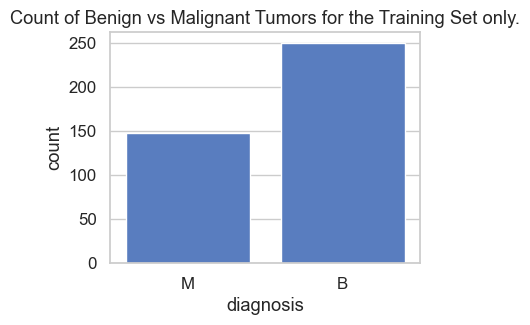


Feature Subset Counts:
_mean features:  10
_se features:    10
_worst features: 10
---------------------------------------------------------------------------------------------


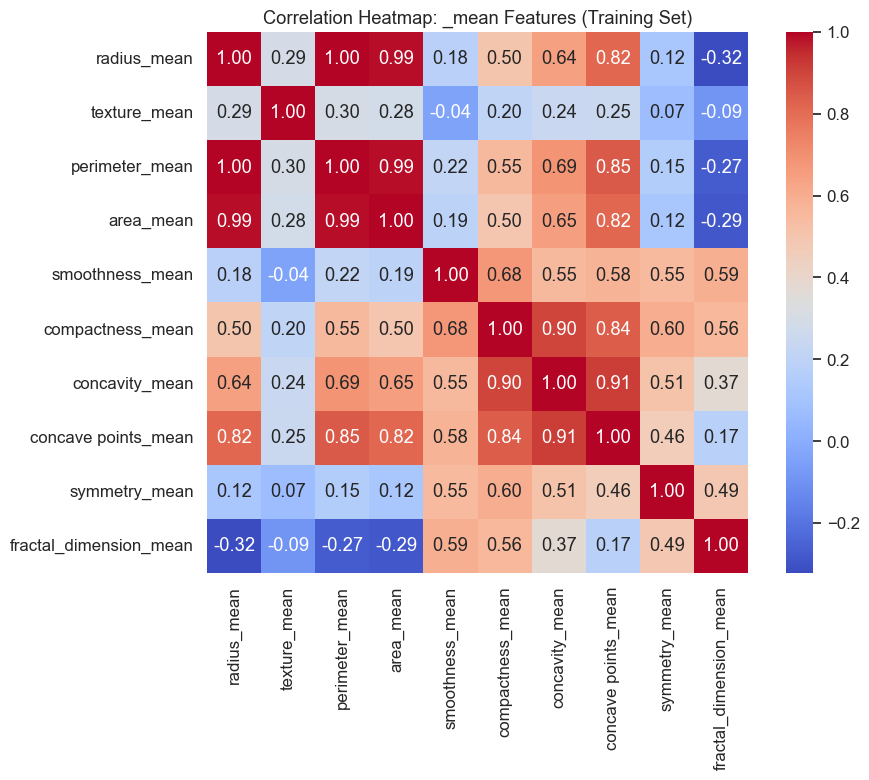

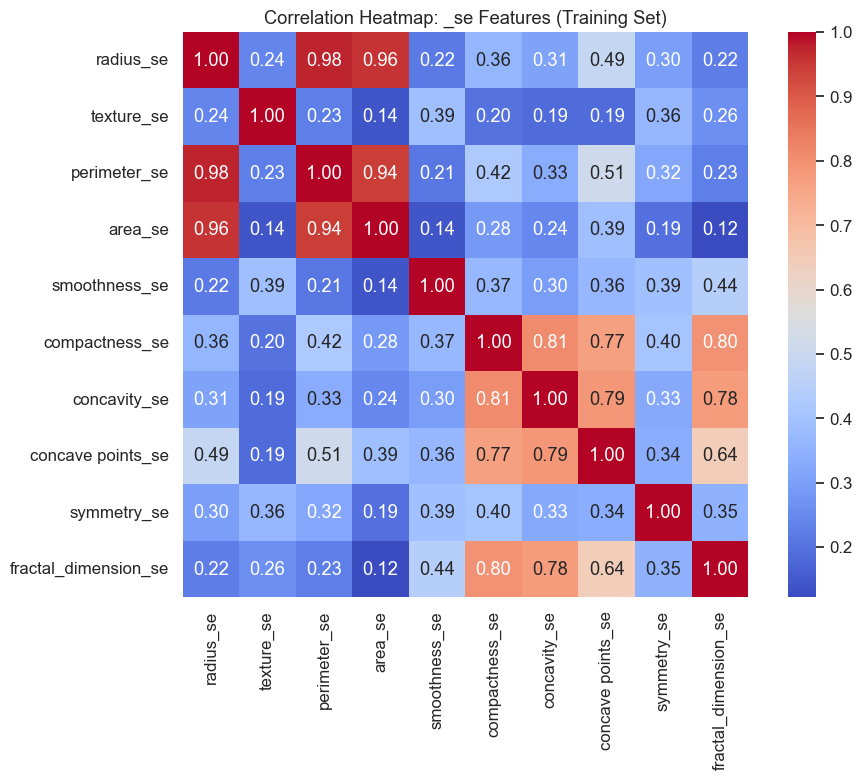

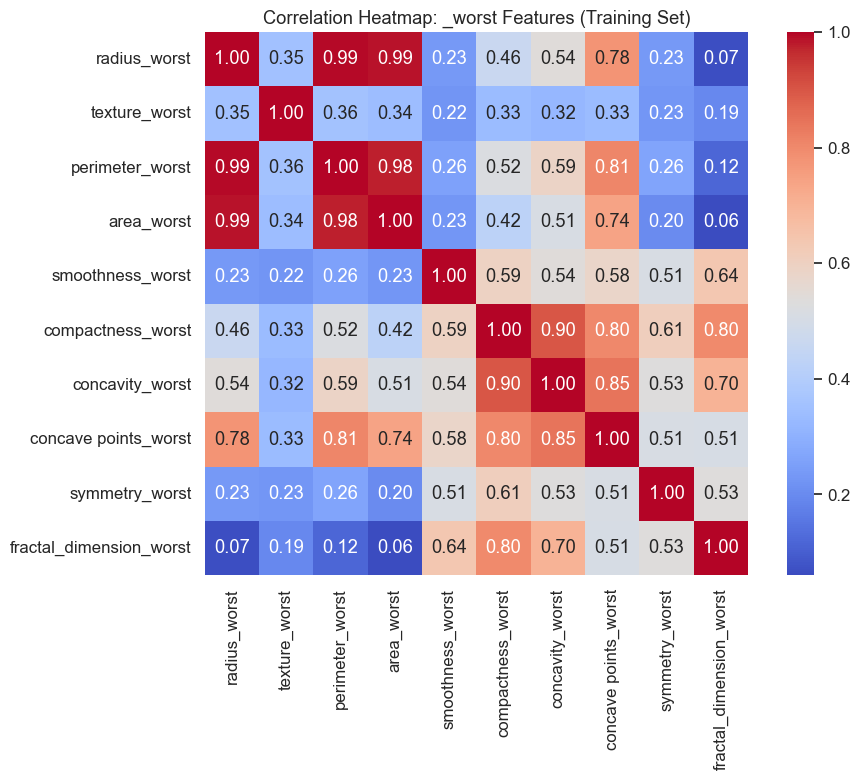

In [7]:
# ---------------------------------------------------------------------------------------------
# Data Visualization: Exploratory Analysis (Training Data Only)
# ---------------------------------------------------------------------------------------------

# Set default style for the plots
sns.set(style="whitegrid", palette="muted", font_scale=1.1)
plt.rcParams['figure.figsize'] = (10,6)

# Define target variable
target = 'diagnosis'

# ---------------------------------------------------------------------------------------------
# Class Distribution
# ---------------------------------------------------------------------------------------------
print(f"\nClass Distribution for Target Variable ('{target}') in Training Set:")
print(f"---------------------------------------------------------------------------------------------")
plt.figure(figsize=(4,3))
sns.countplot(x=y_train)
plt.title(f"Count of Benign vs Malignant Tumors for the Training Set only.")
plt.show()

# ---------------------------------------------------------------------------------------------
# Correlation Heatmaps for Feature Subsets (_mean, _se, _worst) 
# ---------------------------------------------------------------------------------------------

# Split X_train features into three groups
mean_features  = [col for col in X_train.columns if col.endswith('_mean')]
se_features    = [col for col in X_train.columns if col.endswith('_se')]
worst_features = [col for col in X_train.columns if col.endswith('_worst')]

print("\nFeature Subset Counts:")
print(f"_mean features:  {len(mean_features)}")
print(f"_se features:    {len(se_features)}")
print(f"_worst features: {len(worst_features)}")
print("---------------------------------------------------------------------------------------------")

# -------------------------
# Heatmap: _mean features
# -------------------------
plt.figure(figsize=(10, 8))
sns.heatmap(
    X_train[mean_features].corr(),
    annot=True,
    cmap='coolwarm',
    fmt=".2f",
    square=True,
    cbar=True
)
plt.title("Correlation Heatmap: _mean Features (Training Set)")
plt.tight_layout()
plt.show()

# -------------------------
# Heatmap: _se features
# -------------------------
plt.figure(figsize=(10, 8))
sns.heatmap(
    X_train[se_features].corr(),
    annot=True,
    cmap='coolwarm',
    fmt=".2f",
    square=True,
    cbar=True
)
plt.title("Correlation Heatmap: _se Features (Training Set)")
plt.tight_layout()
plt.show()

# -------------------------
# Heatmap: _worst features
# -------------------------
plt.figure(figsize=(10, 8))
sns.heatmap(
    X_train[worst_features].corr(),
    annot=True,
    cmap='coolwarm',
    fmt=".2f",
    square=True,
    cbar=True
)
plt.title("Correlation Heatmap: _worst Features (Training Set)")
plt.tight_layout()
plt.show()

#### 👀 Observations on Feature Correlation & Selection

> Correlation analysis indicates that several feature groups exhibit **very strong linear relationships**, leading to potential redundancy:
>
> - Within each category (`_mean`, `_se`, `_worst`), **radius**, **perimeter**, and **area** are **highly correlated** (r > 0.94), suggesting they are capturing largely the same geometric property.
> - Likewise, **compactness**, **concavity**, and **concave points** are strongly correlated (r ≈ 0.77–0.91), indicating overlapping representation of tumor shape irregularity.
>
> ✍️ **Action Plan**
> - Retain **area** features and drop **radius** and **perimeter** variants within each category.  
>   *Rationale:* Area encapsulates both perimeter and radius information, making it a richer and more comprehensive metric.
> - For the shape-related trio (**compactness\_**, **concavity\_**, **concave points\_**), create a **single composite feature** to preserve their shared contribution while reducing multicollinearity.
>
> 📌 **Correlation Threshold**
> - Features with **correlation ≥ 0.94** are considered redundant and subject to removal.
> - Features with **strong but lower correlation** are preserved using **aggregated representations**, rather than being discarded.
>
> 🔑 **Composite Feature Weighting**
> To derive a composite feature from **compactness\_**, **concavity\_**, **concave points\_**, we will calculate their feature importance using RandomForestClassifier temporarily, and derive relative weights based on the feature importance within each subset (_mean, _se, _worst).

#### 🧮 Composite Feature: Calculating Weights Based on Feature Importance

> Feature importance derived from the Random Forest model is used to assign **data-driven weights** to the **`compactness-`, `concavity-`,** and **`concave points_`** -related features within each measurement subset (`_mean`, `_se`, `_worst`). This ensures that the composite representations reflect **predictive strength** rather than raw magnitude.


In [8]:
# ---------------------------------------------------------------------------------------------
# Calculating importance-based weights for compactness_, concavity_, and concave points_ features
# ---------------------------------------------------------------------------------------------

# 0. Encode target (B=0, M=1)
y_train_encoded = y_train.map({'B': 0, 'M': 1})

# Define feature groups
compactness_sets = {
    'mean': ['compactness_mean', 'concavity_mean', 'concave points_mean'],
    'se': ['compactness_se', 'concavity_se', 'concave points_se'],
    'worst': ['compactness_worst', 'concavity_worst', 'concave points_worst']
}

# Train Random Forest on full reduced dataset
rf = RandomForestClassifier(n_estimators=500, random_state=42)
rf.fit(X_train, y_train_encoded)

# Extract importances for 9 features of interest
fi = pd.Series(rf.feature_importances_, index=X_train.columns)
fi_selected = fi[[col for cols in compactness_sets.values() for col in cols]]

# Dictionary to store normalized arrays
subset_weights = {}

print(f"Feature-importance-derived weight ratios for composite features:\n")

for subset_name, feature_list in compactness_sets.items():
    # Extract subset importances
    imps = fi_selected[feature_list]
    
    # Normalize to sum=1
    weights = (imps / imps.sum()).values
    
    subset_weights[subset_name] = weights  # store as np array
    
    print(f"Subset: {subset_name}")
    for feat, w in zip(feature_list, weights):
        print(f"  {feat}: weight = {w:.3f}")
    print()

print("Stored weights (ready for composite feature creation):")
print(subset_weights)


Feature-importance-derived weight ratios for composite features:

Subset: mean
  compactness_mean: weight = 0.087
  concavity_mean: weight = 0.278
  concave points_mean: weight = 0.635

Subset: se
  compactness_se: weight = 0.373
  concavity_se: weight = 0.336
  concave points_se: weight = 0.291

Subset: worst
  compactness_worst: weight = 0.100
  concavity_worst: weight = 0.234
  concave points_worst: weight = 0.666

Stored weights (ready for composite feature creation):
{'mean': array([0.08723335, 0.27806879, 0.63469786]), 'se': array([0.37328838, 0.33594998, 0.29076164]), 'worst': array([0.09982347, 0.23396706, 0.66620947])}


### ✂️ Feature Reduction (For Visualization Purposes Only)

> As part of exploratory data analysis, we temporarily reduce the feature set **to improve interpretability** during visual inspection:
>
> - Retain the **area\_** features while **removing radius\_ and perimeter\_**, since they are strongly correlated with area.
> - Replace the highly correlated **compactness\_**, **concavity\_**, and **concave points\_** feature groups with a **single composite feature**.
>
> ⚠️ These feature removals are **only for visualization** at this stage.  
> The original feature sets (X_train, X_test) remain **unchanged** for model training and evaluation.
>
> To support this, a separate dataset (**X_train_reduced**, and if needed **X_test_reduced**) is created exclusively for visual data exploration.
>
> A composite feature is added temporarily to evaluate its usefulness; it will be included or discarded later depending on the observations found during the visual interpretation.

In [9]:
# ---------------------------------------------------------------------------------------------
# SAFE FEATURE REDUCTION: WORK ONLY ON COPIES WHILE RETAINING X_test, X_train INTACT
# ---------------------------------------------------------------------------------------------

# Make clean copies for feature reduction work
X_train_vis = X_train.copy()
X_test_vis  = X_test.copy()

# Define features to always keep
additional_features = [
    'smoothness_mean', 'smoothness_se', 'smoothness_worst',
    'symmetry_mean', 'symmetry_se', 'symmetry_worst',
    'fractal_dimension_mean', 'fractal_dimension_se', 'fractal_dimension_worst',
    'texture_mean', 'texture_se', 'texture_worst'
]

# Keep area_* from each subset
area_features = [f'area{suffix}' for suffix in ['_mean', '_se', '_worst']]

# ---------------------------------------------------------------------------------------------
# Create composite features *ONLY ON COPIES*, using importance-derived weights
# ---------------------------------------------------------------------------------------------

compactness_sets = {
    'mean': ['compactness_mean', 'concavity_mean', 'concave points_mean'],
    'se': ['compactness_se', 'concavity_se', 'concave points_se'],
    'worst': ['compactness_worst', 'concavity_worst', 'concave points_worst']
}

for subset in compactness_sets:
    feature_names = compactness_sets[subset]
    weight_vector = subset_weights[subset]  # previously computed vector
    
    # Compute weighted composite for train copy
    X_train_vis[f'core_weighted_{subset}'] = (
        X_train_vis[feature_names].values @ weight_vector
    )
    
    # Compute weighted composite for test copy
    X_test_vis[f'core_weighted_{subset}'] = (
        X_test_vis[feature_names].values @ weight_vector
    )

# ---------------------------------------------------------------------------------------------
# BUILD FINAL REDUCED FEATURE SET (FOR VISUALIZATION)
# ---------------------------------------------------------------------------------------------

features_to_keep = (
    area_features +
    [f'core_weighted_{subset}' for subset in ['mean', 'se', 'worst']] +
    additional_features
)

# These are the only reduced datasets
X_train_reduced = X_train_vis[features_to_keep].copy()
X_test_reduced  = X_test_vis[features_to_keep].copy()

print("Reduced Training Feature Set Shape:", X_train_reduced.shape)
print("Reduced Test Feature Set Shape:", X_test_reduced.shape)

print("\nFeatures kept:")
print(X_train_reduced.columns.tolist())

print("\n---------------------------------------------------------------------------------------------")
print("Feature reduction completed using TEMPORARY copies: X_train and X_test remain unmodified.")
print("---------------------------------------------------------------------------------------------")


Reduced Training Feature Set Shape: (398, 18)
Reduced Test Feature Set Shape: (171, 18)

Features kept:
['area_mean', 'area_se', 'area_worst', 'core_weighted_mean', 'core_weighted_se', 'core_weighted_worst', 'smoothness_mean', 'smoothness_se', 'smoothness_worst', 'symmetry_mean', 'symmetry_se', 'symmetry_worst', 'fractal_dimension_mean', 'fractal_dimension_se', 'fractal_dimension_worst', 'texture_mean', 'texture_se', 'texture_worst']

---------------------------------------------------------------------------------------------
Feature reduction completed using TEMPORARY copies: X_train and X_test remain unmodified.
---------------------------------------------------------------------------------------------


#### 📊 Boxplot Analysis of Selected Features

> Examine how the reduced, non-redundant features vary between Benign and Malignant tumors in the training set. 
> Boxplots help visualize differences, view outliers, and assess which features could be most informative for distinguishing classes before modeling.


Boxplots of reduced numeric features by 'diagnosis':
---------------------------------------------------------------------------------------------


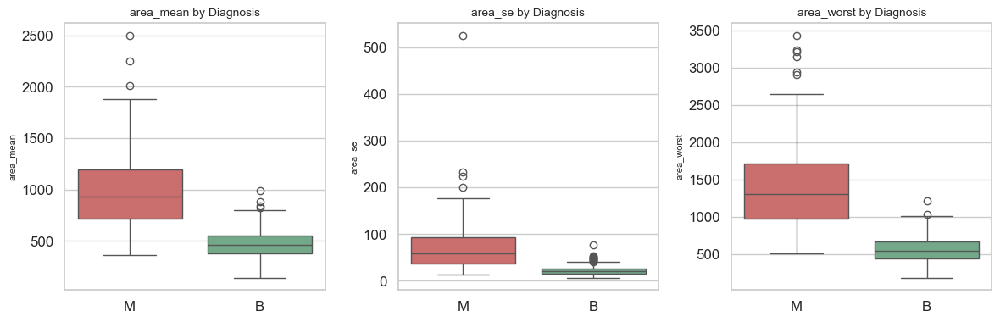

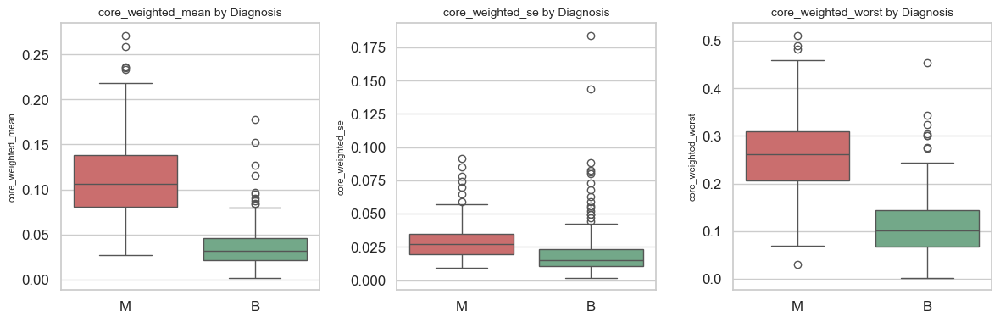

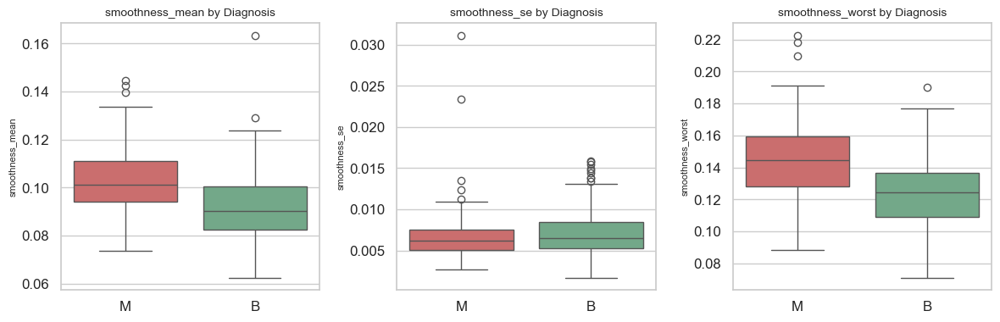

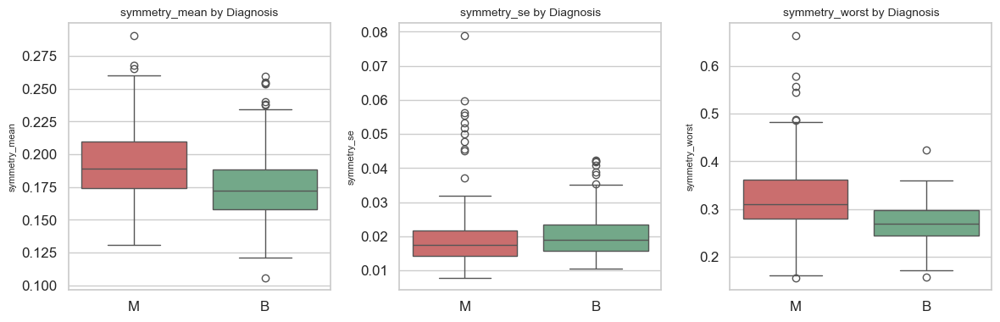

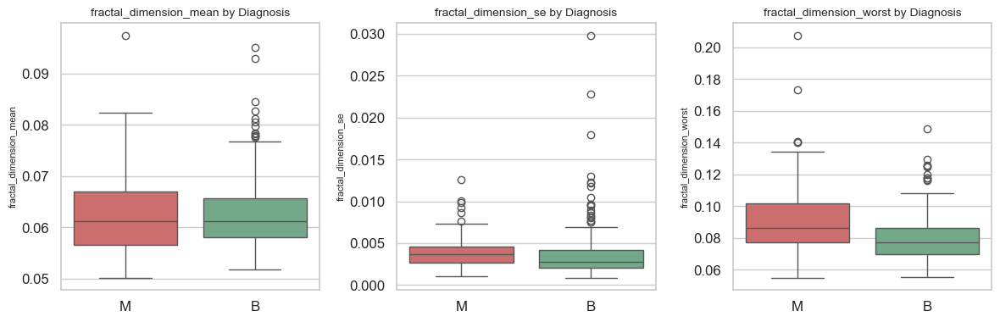

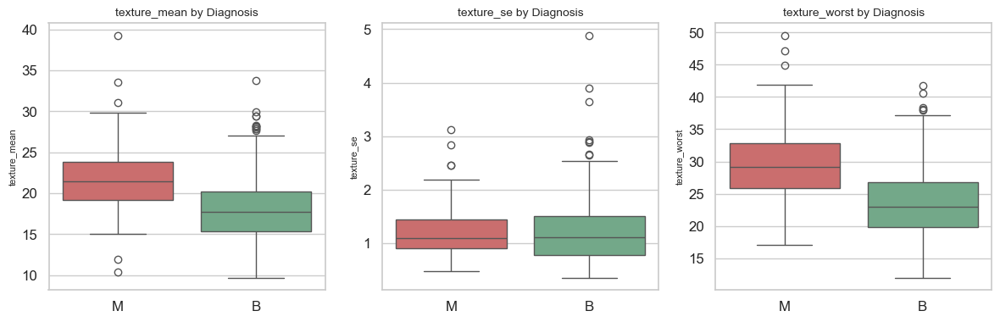

In [10]:
# ---------------------------------------------------------------------------------------------
# Box Plots for Reduced Features vs Target (Training Data Only)
# ---------------------------------------------------------------------------------------------

# Define target column
target = 'diagnosis'

# Set default style for plots
sns.set(style="whitegrid", palette='Set2', font_scale=1.1)
plt.rcParams['figure.figsize'] = (10,6)

# Combine features + target (ensures consistent indexing)
train_plot_df = X_train_reduced.copy()
train_plot_df[target] = y_train

numeric_cols = X_train_reduced.columns.tolist()

print(f"\nBoxplots of reduced numeric features by '{target}':")
print(f"---------------------------------------------------------------------------------------------")

plots_per_row = 3
num_features = len(numeric_cols)
num_rows = (num_features + plots_per_row - 1) // plots_per_row

for i in range(num_rows):
    start_idx = i * plots_per_row
    end_idx = min(start_idx + plots_per_row, num_features)
    features_subset = numeric_cols[start_idx:end_idx]

    fig, axes = plt.subplots(1, len(features_subset), figsize=(4 * len(features_subset), 4))
    if len(features_subset) == 1:
        axes = [axes]

    for ax, col in zip(axes, features_subset):
        sns.boxplot(
            data=train_plot_df,
            x=target,  # use column name
            y=col,
            hue=target, # To map classes to the palette colors below
            palette=['#D95F5F', '#6AB187'],  # Green for B, Red for M
            ax=ax
        )
        ax.set_title(f"{col} by Diagnosis", fontsize=10)
        ax.set_xlabel("")        # clean x-label
        ax.set_ylabel(col, fontsize=8)

    plt.tight_layout()
    plt.show()


#### 👀 Observations
> The box plots for the **area\_** and **core\_weighted\_** feature groups show **minimal to no overlap** between Benign (B) and Malignant (M) tumors, indicating strong discriminative power.  
>
> Other features exhibit some degree of overlap; however, when used in combination within a multivariate model, they may still contribute meaningful separation between the classes.
>
> Overall, the visual patterns suggest that the selected features are **well-suited for effective classification** of tumor diagnosis.


#### 📊 Pairplot Analysis of Feature Subsets

> Explore relationships between the reduced, non-redundant features within each subset (_mean, _se, _worst) in the training set.  
> Pairplots help visualize feature interactions, clustering patterns, and potential separability between Benign and Malignant tumor classes before modeling.


Pairplot for _mean features:
---------------------------------------------------------------------------------------------


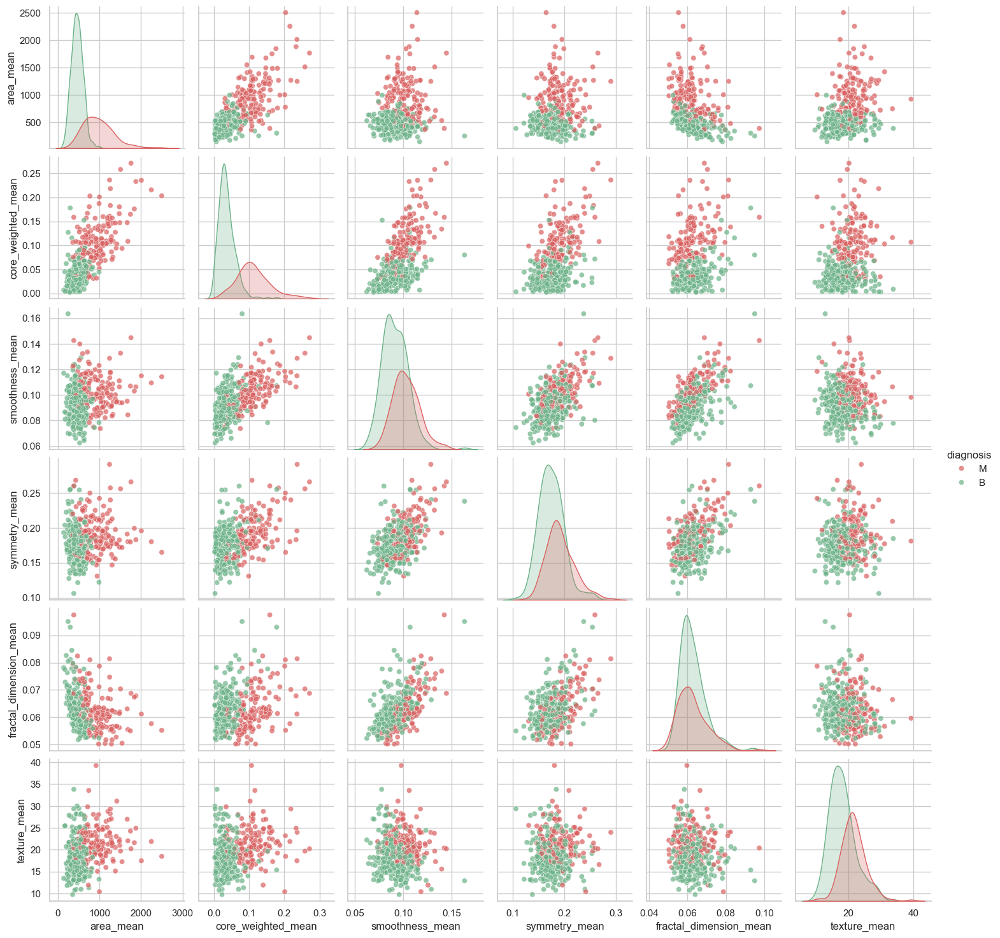


Pairplot for _se features:
---------------------------------------------------------------------------------------------


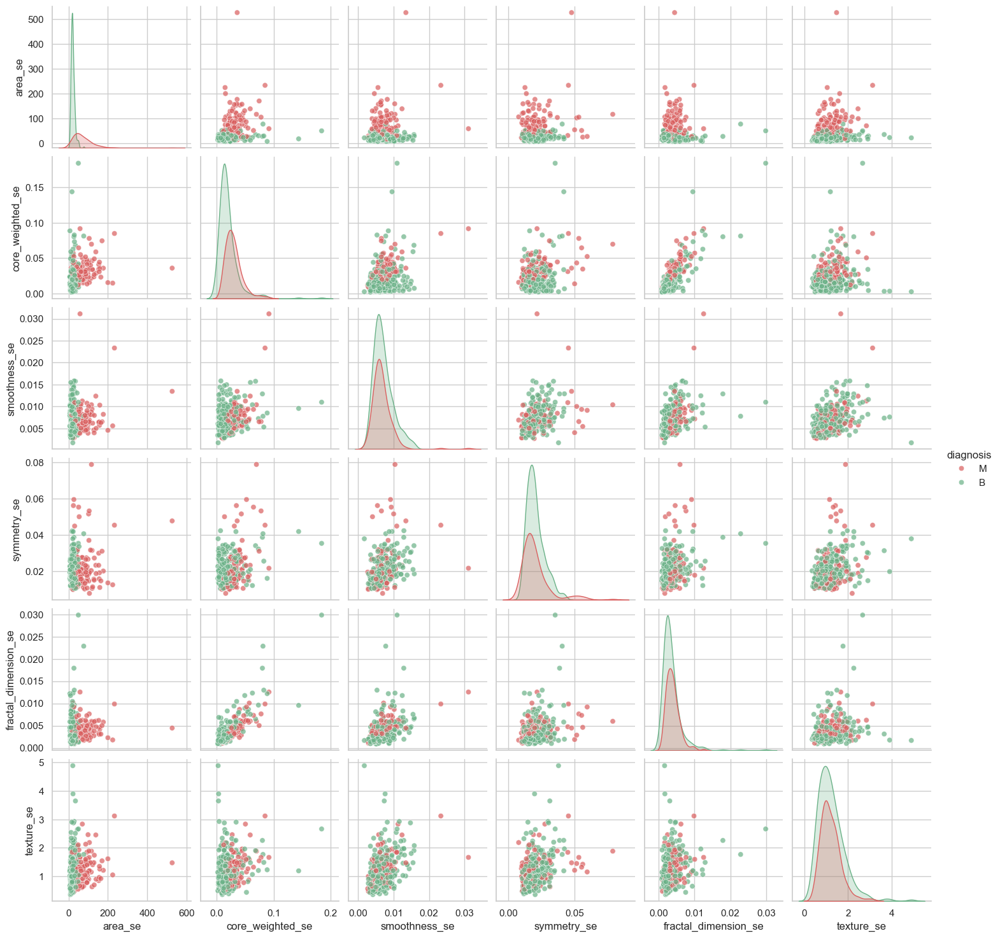


Pairplot for _worst features:
---------------------------------------------------------------------------------------------


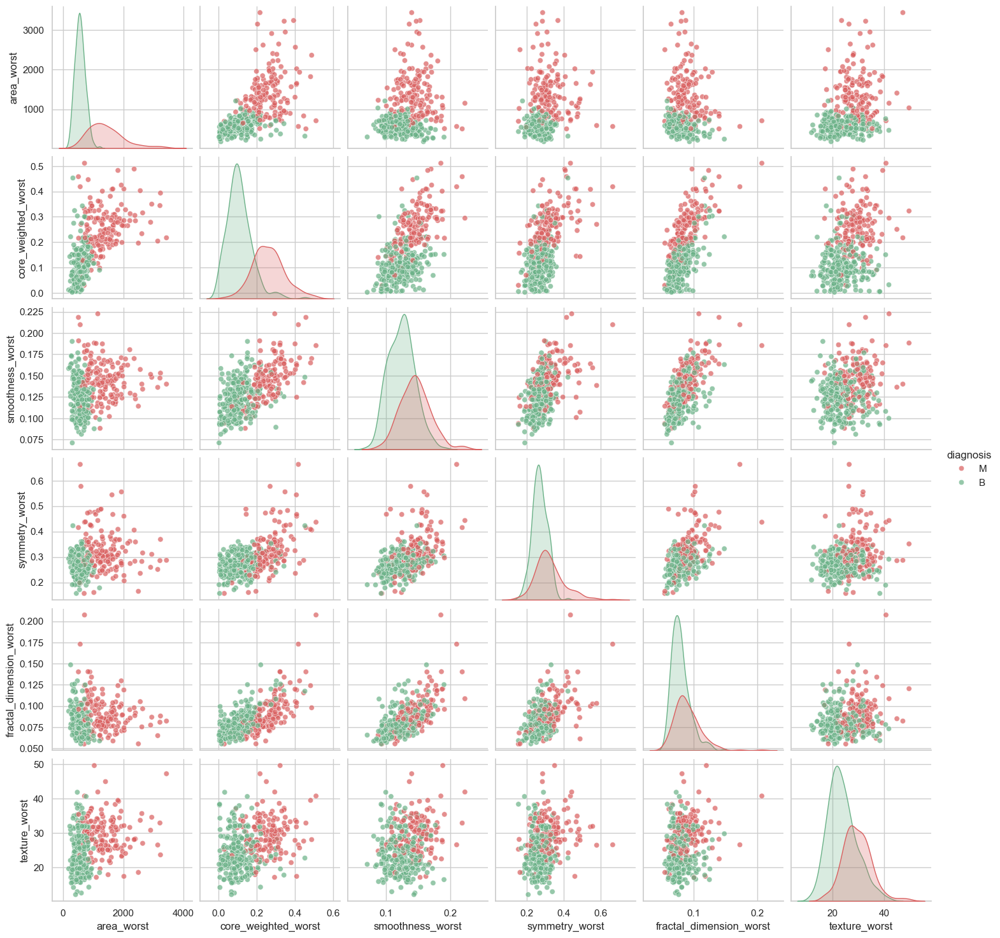

In [11]:
# ---------------------------------------------------------------------------------------------
# Pairplots for Feature Subsets (Training Data Only)
# ---------------------------------------------------------------------------------------------

# We use same colors for B and M class as used earlier
custom_palette = {'B': '#6AB187', 'M': '#D95F5F'}

# Set default style for plots
sns.set(style="whitegrid", palette="muted", font_scale=1.0)
plt.rcParams['figure.figsize'] = (10,6)

# Define subsets
mean_features = [col for col in X_train_reduced.columns if col.endswith('_mean')]
se_features = [col for col in X_train_reduced.columns if col.endswith('_se')]
worst_features = [col for col in X_train_reduced.columns if col.endswith('_worst')]

# Target variable
target = 'diagnosis'

# Function to generate pairplot for a subset
def plot_pairplot(subset_features, subset_name):
    print(f"\nPairplot for {subset_name} features:")
    print(f"---------------------------------------------------------------------------------------------")
    df_plot = X_train_reduced[subset_features].copy()
    df_plot[target] = y_train  # add target column for hue
    sns.pairplot(df_plot, hue=target, diag_kind='kde', palette=custom_palette, plot_kws={'alpha':0.7})
    plt.show()

# Generate pairplots for each subset
plot_pairplot(mean_features, "_mean")
plot_pairplot(se_features, "_se")
plot_pairplot(worst_features, "_worst")
plt.show()


#### 👀 Observations
> In most of the pair plots, the **Benign (B)** and **Malignant (M)** classes show noticeable visual separation.
>
> For the **area\_** and **core\_weighted\_** feature groups:
> - The distribution of **Benign** tumors is **more concentrated** (narrower density curve) with a **higher peak**, indicating lower variability.
> - The distribution of **Malignant** tumors is **more dispersed** (wider density curve) with a **flatter peak**, indicating greater variability.
>
> These characteristics make the **area\_** and **core\_weighted\_** features strong candidates for discriminating between the two classes.

#### 📊 3D PCA Projection of Training Data: For Visual Analysis Only

> Visualize the training data in three principal components to capture the most variance in reduced features.  
> The 3D PCA surface plot helps identify class separation and overlap between Benign and Malignant tumors, giving an intuitive sense of how well the features can discriminate between classes before modeling.

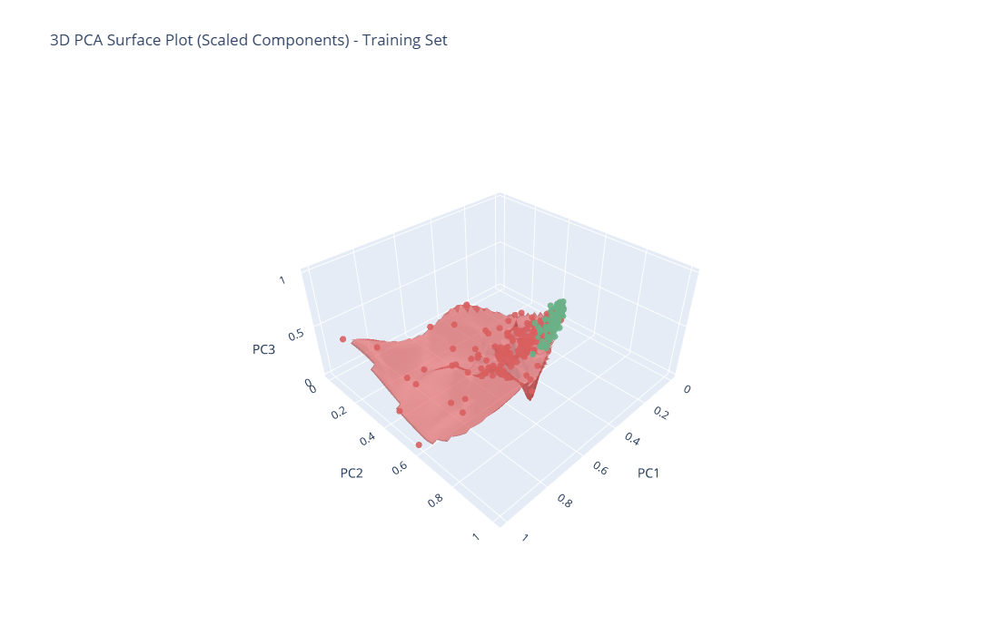

In [12]:
# ---------------------------------------------------------------------------------------------
# 3D PCA Surface Plot (Interactive) - Scaled & Proper Aspect Ratio
# ---------------------------------------------------------------------------------------------

# Custom class colors
class_colors = {
    0: '#6AB187',  # Benign
    1: '#D95F5F'   # Malignant
}

# Encode Target
y_train_encoded = y_train.map({'B': 0, 'M': 1})
y_test_encoded = y_test.map({'B': 0, 'M': 1})

# PCA on reduced features
pca = PCA(n_components=3)
X_pca = pca.fit_transform(X_train_reduced)

# Scale for visualization
scaler = MinMaxScaler()
X_pca_scaled = scaler.fit_transform(X_pca)
X_plot = pd.DataFrame(X_pca_scaled, columns=['PC1','PC2','PC3'], index=X_train_reduced.index)

target = y_train_encoded

# Grid for interpolation
xi = np.linspace(0, 1, 50)
yi = np.linspace(0, 1, 50)
X_grid, Y_grid = np.meshgrid(xi, yi)

fig = go.Figure()

# Plot per-class surfaces
for cls in [0, 1]:
    idx = target[target == cls].index
    Z_cls = X_plot.loc[idx, 'PC3'].values
    X_cls = X_plot.loc[idx, 'PC1'].values
    Y_cls = X_plot.loc[idx, 'PC2'].values
    
    # Interpolate surface for each class
    Z_grid = griddata((X_cls, Y_cls), Z_cls, (X_grid, Y_grid), method='cubic')
    
    fig.add_trace(go.Surface(
        x=X_grid, y=Y_grid, z=Z_grid,
        colorscale=[[0, class_colors[cls]], [1, class_colors[cls]]],
        opacity=0.7,                         # consistent with scatter alpha
        showscale=False,
        name='Benign Surface' if cls == 0 else 'Malignant Surface'
    ))

# Scatter Points (same colors and opacity)
fig.add_trace(go.Scatter3d(
    x=X_plot['PC1'], y=X_plot['PC2'], z=X_plot['PC3'],
    mode='markers',
    marker=dict(
        size=4,
        color=target.map(class_colors),      # same class colors
        opacity=0.9
    ),
    name='Data Points'
))

# Layout
fig.update_layout(
    title='3D PCA Surface Plot (Scaled Components) - Training Set',
    scene=dict(
        xaxis_title='PC1',
        yaxis_title='PC2',
        zaxis_title='PC3',
        aspectratio=dict(x=1, y=1, z=0.5)
    ),
    legend=dict(title='Class'),
    width=900, height=700,
)

fig.show()


#### 👀 Observations
> The PCA surface visualization shows **separation** between the Benign (B) and Malignant (M) classes across the principal components. While **some overlap** exists at the class boundaries, the strong distinction in overall structure suggests that the feature set is likely to support **high classification accuracy**.


#### 🌳 Feature Importance Using Random Forest

> Evaluate the contribution of each reduced feature in predicting the target variable using a Random Forest classifier.  
> Feature importance scores highlight which features carry the most predictive power, guiding potential further feature selection and model interpretation.

Feature Importance (Random Forest):
area_worst                 0.235366
core_weighted_mean         0.173701
area_mean                  0.137754
core_weighted_worst        0.124372
area_se                    0.094348
texture_worst              0.040394
symmetry_worst             0.032992
smoothness_worst           0.028257
texture_mean               0.027603
smoothness_mean            0.017322
core_weighted_se           0.017160
fractal_dimension_se       0.013542
fractal_dimension_worst    0.011455
symmetry_se                0.010473
fractal_dimension_mean     0.009346
texture_se                 0.008899
smoothness_se              0.008830
symmetry_mean              0.008185
dtype: float64


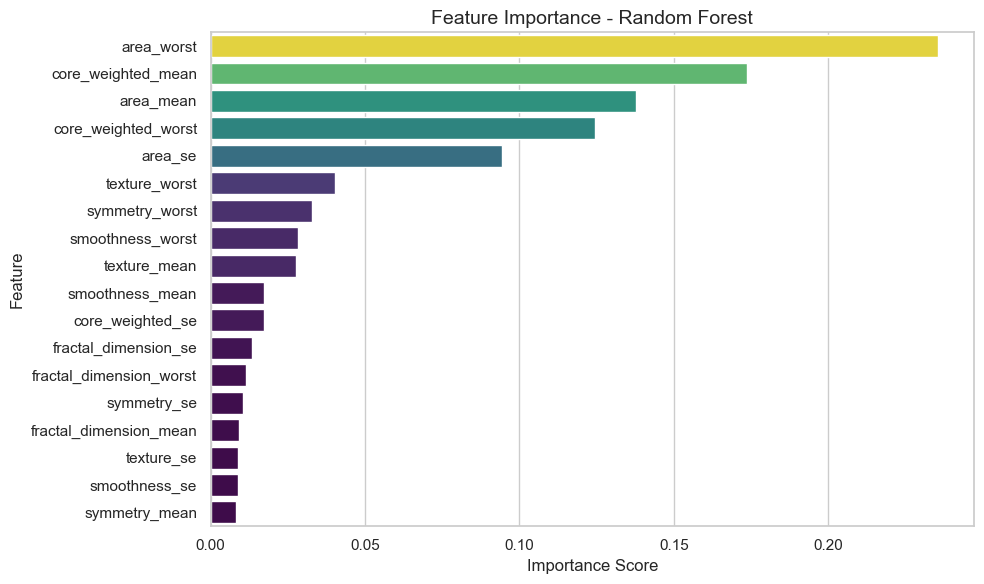

In [13]:
# ---------------------------------------------------------------------------------------------
# Feature Importance using Random Forest Classifier (Training Data)
# ---------------------------------------------------------------------------------------------

# Initialize model
rf = RandomForestClassifier(n_estimators=500, random_state=42)

# Fit model on training data
rf.fit(X_train_reduced, y_train_encoded)

# Get feature importance
feature_importances = pd.Series(rf.feature_importances_, index=X_train_reduced.columns)
feature_importances = feature_importances.sort_values(ascending=False)

print("Feature Importance (Random Forest):")
print(feature_importances)

# Plot horizontal barplot
plt.figure(figsize=(10,6))

# Normalize importance values for colormap
norm = plt.Normalize(feature_importances.min(), feature_importances.max())
colors = plt.cm.viridis(norm(feature_importances.values))  
colors = colors.tolist()  

sns.barplot(
    x=feature_importances.values,
    y=feature_importances.index,
    hue=feature_importances.index,  
    dodge=False,                   
    palette=colors,
    legend=False                  
)

plt.title("Feature Importance - Random Forest", fontsize=14)
plt.xlabel("Importance Score", fontsize=12)
plt.ylabel("Feature", fontsize=12)
plt.tight_layout()
plt.show()

#### 👀 Observations
> The Random Forest feature importance results confirm that **area-related measurements** are the strongest predictors of tumor malignancy. In particular, `area_worst` and `area_mean` show the highest contribution to classification accuracy.
>
> The synthetic feature `core_weighted_mean`, derived from compactness-, concavity-, and concave points-related variables, demonstrates **high predictive strength**, validating the decision to aggregate shape irregularity metrics rather than dropping correlated features.
>
> Overall, features from the `_worst` subset consistently rank above their `_mean` and `_se` counterparts. This suggests that **the most severe expression of tumor characteristics**—as captured in the `_worst` metrics—provides clearer separation between Benign (B) and Malignant (M) cases.
>
> Lower-ranked predictors such as `smoothness_se`, `symmetry_mean`, and `texture_se` still add minor value when modeled alongside more informative features, but individually they have **limited discriminative power**.


### ⚙️ Data Pre-processing & Preparation

> We do **not** perform a new train–test split. The same split used during exploration is retained to ensure consistency between insights derived from exploratory analysis and their application to the modeling stage.
>
> This is the **final pipeline**, meaning all transformations are intentionally applied to `X_train` and `X_test`. The earlier exploratory analysis was performed on separate copies to prevent leakage; therefore, **the core datasets remain clean** for this stage.
>
> The pre-processing steps performed are:
>
> - **Target Encoding:** Convert `diagnosis` into numeric labels (`B → 0`, `M → 1`).
> - **Feature Subset Structuring:** Group features into `_mean`, `_se`, and `_worst` subsets to mirror the natural structure of the dataset.
> - **Feature Importance–Driven Weighting:**  
>   Train a Random Forest model on the full training set and compute importance scores. For each subset:
>   - Derive weights for the shape-related features (`compactness_`, `concavity_`, `concave points_`).
>   - Derive weights for the mass-related features (`area_`, `texture_`, `smoothness_`).
>   - Normalize weights so that each subset’s weights sum to 1.
> - **Composite Feature Engineering:**  
>   Using the subset-specific weights:  
>   - Create `core_weighted_*` features to capture shape irregularity.  
>   - Create `mass_nature_*` features to capture tumor mass and structural patterns.
> - **Feature Reduction:**  
>   Remove redundant or highly correlated predictors—including all `radius_`, `perimeter_` features—since their information is now preserved in composite form.
> - **Outlier Handling:**  
>   Clip extreme values at the 1st and 99th percentiles to reduce sensitivity to outliers.
> - **Scaling:**  
>   Apply `RobustScaler` to standardize numerical features while minimizing the impact of extreme values.
>
> The final output of the preprocessing pipeline includes:
> - `X_train_scaled` and `X_test_scaled`: fully transformed feature matrices  
> - `y_train_encoded` and `y_test_encoded`: encoded and aligned target vectors  
>
> These datasets are now ready for model training, evaluation, and comparison across algorithms.


In [14]:
# ==============================================================================================
# FINAL PREPROCESSING PIPELINE
# ==============================================================================================

# ----------------------------------------------------------------------------------------------
# 0. Encode target variable (B=0, M=1)
# ----------------------------------------------------------------------------------------------
y_train_encoded = y_train.map({'B': 0, 'M': 1})
y_test_encoded  = y_test.map({'B': 0, 'M': 1})


# ----------------------------------------------------------------------------------------------
# 1. DEFINE FEATURE SUBSETS
# ----------------------------------------------------------------------------------------------

subsets = ['mean', 'se', 'worst']

compactness_sets = {
    'mean': ['compactness_mean', 'concavity_mean', 'concave points_mean'],
    'se': ['compactness_se', 'concavity_se', 'concave points_se'],
    'worst': ['compactness_worst', 'concavity_worst', 'concave points_worst']
}

mass_sets = {
    'mean': ['area_mean', 'texture_mean', 'smoothness_mean'],
    'se': ['area_se', 'texture_se', 'smoothness_se'],
    'worst': ['area_worst', 'texture_worst', 'smoothness_worst']
}


# ----------------------------------------------------------------------------------------------
# 2. RANDOM FOREST FEATURE IMPORTANCE (on full train set)
# ----------------------------------------------------------------------------------------------

rf = RandomForestClassifier(n_estimators=500, random_state=42)
rf.fit(X_train, y_train_encoded)

fi = pd.Series(rf.feature_importances_, index=X_train.columns)


# ----------------------------------------------------------------------------------------------
# 3. CALCULATE SUBSET-SPECIFIC WEIGHT VECTORS (sum = 1 per subset)
# ----------------------------------------------------------------------------------------------

subset_weights_core = {}        # for compactness/concavity/concave points
subset_weights_mass = {}        # for area/texture/smoothness

print("\n WEIGHTS FOR CORE-WEIGHTED COMPOSITES\n")

for s in subsets:
    features = compactness_sets[s]
    imps = fi[features]
    weights = (imps / imps.sum()).values
    subset_weights_core[s] = weights
    print(f"Subset: {s} — weights: {np.round(weights,3)}")

print("\n WEIGHTS FOR MASS-NATURE COMPOSITES\n")

for s in subsets:
    features = mass_sets[s]
    imps = fi[features]
    weights = (imps / imps.sum()).values
    subset_weights_mass[s] = weights
    print(f"Subset: {s} — weights: {np.round(weights,3)}")


# ----------------------------------------------------------------------------------------------
# 4. CREATE COMPOSITE FEATURES (train + test)
# ----------------------------------------------------------------------------------------------

for s in subsets:
    # CORE-WEIGHTED (shape irregularity)
    X_train[f'core_weighted_{s}'] = X_train[compactness_sets[s]].values @ subset_weights_core[s]
    X_test[f'core_weighted_{s}']  = X_test[compactness_sets[s]].values  @ subset_weights_core[s]

    # MASS-NATURE (area + texture + smoothness)
    X_train[f'mass_nature_{s}'] = X_train[mass_sets[s]].values @ subset_weights_mass[s]
    X_test[f'mass_nature_{s}']  = X_test[mass_sets[s]].values  @ subset_weights_mass[s]


# ----------------------------------------------------------------------------------------------
# 5. DROP RAW FEATURES REPLACED BY COMPOSITES
# ----------------------------------------------------------------------------------------------

cols_to_drop = []

# Drop radius_, perimeter_, and raw contributing features
for prefix in ['radius', 'perimeter',
               'compactness', 'concavity', 'concave points']:
    for s in subsets:
        cols_to_drop.append(f'{prefix}_{s}')

X_train.drop(columns=cols_to_drop, inplace=True, errors='ignore')
X_test.drop(columns=cols_to_drop, inplace=True, errors='ignore')


# ==============================================================================================
# 6. OUTLIER HANDLING
# ==============================================================================================

for df in [X_train, X_test]:
    q01 = df.quantile(0.01)
    q99 = df.quantile(0.99)
    df[:] = df.clip(q01, q99, axis=1)


# ==============================================================================================
# 7. SCALING
# ==============================================================================================

scaler = RobustScaler()

X_train_scaled = pd.DataFrame(
    scaler.fit_transform(X_train),
    columns=X_train.columns,
    index=X_train.index
)

X_test_scaled = pd.DataFrame(
    scaler.transform(X_test),
    columns=X_test.columns,
    index=X_test.index
)


# ==============================================================================================
# 8. FINAL OUTPUT CHECK
# ==============================================================================================

print("\n==============================================")
print(" FINAL SHAPES AFTER PREPROCESSING")
print("==============================================")
print("X_train_scaled:", X_train_scaled.shape)
print("X_test_scaled :", X_test_scaled.shape)
print("y_train_encoded:", y_train_encoded.shape)
print("y_test_encoded :", y_test_encoded.shape)

print("\nSample of X_train_scaled (head 10):")
display(X_train_scaled.head(10))

print("\nFinal columns after preprocessing:")
print(list(X_train_scaled.columns))



 WEIGHTS FOR CORE-WEIGHTED COMPOSITES

Subset: mean — weights: [0.087 0.278 0.635]
Subset: se — weights: [0.373 0.336 0.291]
Subset: worst — weights: [0.1   0.234 0.666]

 WEIGHTS FOR MASS-NATURE COMPOSITES

Subset: mean — weights: [0.688 0.208 0.104]
Subset: se — weights: [0.825 0.096 0.079]
Subset: worst — weights: [0.802 0.114 0.084]

 FINAL SHAPES AFTER PREPROCESSING
X_train_scaled: (398, 21)
X_test_scaled : (171, 21)
y_train_encoded: (398,)
y_test_encoded : (171,)

Sample of X_train_scaled (head 10):


,texture_mean,area_mean,smoothness_mean,symmetry_mean,fractal_dimension_mean,texture_se,area_se,smoothness_se,symmetry_se,fractal_dimension_se,...,area_worst,smoothness_worst,symmetry_worst,fractal_dimension_worst,core_weighted_mean,mass_nature_mean,core_weighted_se,mass_nature_se,core_weighted_worst,mass_nature_worst
78,0.892906,1.861009,1.694744,2.413505,2.342143,1.195238,3.322414,1.401097,4.394934,1.277556,...,1.540147,1.027408,3.084184,0.944284,2.832166,1.872069,2.841956,3.317747,1.820156,1.541466
330,-0.636240,0.653391,-0.012160,-0.048448,-0.174267,-0.557778,0.313456,-0.155639,-0.509816,0.003778,...,0.632585,0.388410,0.295252,0.539074,0.670544,0.654147,0.553702,0.309899,1.023173,0.632057
378,-0.701310,0.085132,-0.631792,-0.018168,-0.266047,-0.875120,-0.479957,-0.370586,-0.065231,0.780222,...,-0.045214,-0.112764,0.841246,0.787024,-0.175805,0.083973,0.158411,-0.482824,0.118549,-0.045970
213,1.180298,1.067157,0.276124,-1.483724,-0.302062,0.859246,1.227762,3.148817,0.386954,4.198889,...,0.552168,-0.212999,-1.646766,-0.573324,0.799068,1.077231,3.695413,1.226359,0.086764,0.553096
89,-0.685043,0.275710,0.914503,0.962907,0.255591,-0.573806,0.656954,-0.269112,0.706143,0.768222,...,0.195380,-0.106500,0.491098,0.225036,0.581442,0.275179,0.959918,0.652679,0.280571,0.194183
32,0.894713,0.936986,1.243825,1.362604,0.297415,0.444650,1.562574,0.677065,0.294490,0.329556,...,1.082263,1.011746,1.053412,0.229378,1.674547,0.945418,0.712746,1.559306,1.000342,1.083885
240,-0.619973,0.070966,-0.046612,-0.245269,-0.541388,-0.690941,0.093385,0.060679,0.036099,-0.586000,...,-0.001887,-0.103367,-0.430267,-0.721901,-0.047984,0.070135,-0.279945,0.089899,-0.233581,-0.002802
251,-0.104835,-0.377815,-0.086130,0.109008,-0.223061,-0.410897,0.086146,0.029825,0.535149,-0.734000,...,-0.288270,-0.400940,-0.118694,-0.732996,-0.302495,-0.377617,-0.454663,0.083437,-0.489569,-0.288254
414,1.948486,0.456398,-0.605446,0.163512,-0.966599,0.797596,0.751787,0.184436,1.623179,-0.605556,...,0.405120,-0.510572,0.612760,-0.888326,-0.170537,0.468167,-0.146449,0.751066,-0.373735,0.408179
486,-0.394035,0.313398,-0.442812,-1.177896,-0.895730,-0.159519,-0.167587,-0.945492,-0.779607,-0.841556,...,0.240348,-0.529366,-0.541543,-0.680415,-0.116734,0.314267,-0.331062,-0.169123,-0.098289,0.240808



Final columns after preprocessing:
['texture_mean', 'area_mean', 'smoothness_mean', 'symmetry_mean', 'fractal_dimension_mean', 'texture_se', 'area_se', 'smoothness_se', 'symmetry_se', 'fractal_dimension_se', 'texture_worst', 'area_worst', 'smoothness_worst', 'symmetry_worst', 'fractal_dimension_worst', 'core_weighted_mean', 'mass_nature_mean', 'core_weighted_se', 'mass_nature_se', 'core_weighted_worst', 'mass_nature_worst']


### 🤖 Model Training & Evaluation

> Train multiple machine learning classifiers using stratified cross-validation, and check for overfitting/underfitting.

In [15]:
# ---------------------------------------------------------------------------------------------
# Model Training & Evaluation: 7 Classifiers with 5-Fold CV
# ---------------------------------------------------------------------------------------------

from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from sklearn.svm import SVC
from sklearn.neural_network import MLPClassifier

from sklearn.model_selection import StratifiedKFold, cross_validate
from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    roc_auc_score,
    confusion_matrix
)

# ---------------------------------------------------------------------------------------------
# Helper: Get continuous score for ROC-AUC (probabilities or decision function)
# ---------------------------------------------------------------------------------------------
def get_score_for_roc_auc(model, X):
    """
    Returns a 1D array of scores for ROC-AUC.
    Uses predict_proba if available, otherwise decision_function.
    """
    if hasattr(model, "predict_proba"):
        return model.predict_proba(X)[:, 1]
    elif hasattr(model, "decision_function"):
        return model.decision_function(X)
    else:
        # Fallback: use predictions as scores (not ideal, but safe)
        return model.predict(X)

# ---------------------------------------------------------------------------------------------
# Define Models to be used
# ---------------------------------------------------------------------------------------------
models = {
    "Logistic Regression": LogisticRegression(
        max_iter=2000,
        random_state=42
    ),
    "Decision Tree": DecisionTreeClassifier(
        max_depth=None,
        random_state=42
    ),
    "Random Forest": RandomForestClassifier(
        n_estimators=500,
        max_depth=None,
        random_state=42,
        n_jobs=-1
    ),
    "XGBoost": XGBClassifier(
        n_estimators=400,
        learning_rate=0.05,
        max_depth=4,
        subsample=0.8,
        colsample_bytree=0.8,
        
        objective="binary:logistic",
        eval_metric="logloss",
        random_state=42,
        n_jobs=-1
    ),
    "LightGBM": LGBMClassifier(
        n_estimators=300,
        learning_rate=0.05,
        max_depth=3,
        subsample=0.8,
        colsample_bytree=0.8,
        objective="binary",
        random_state=42,
        n_jobs=-1,
        verbose=-1
    ),
    "SVM (RBF Kernel)": SVC(
        kernel="rbf",
        probability=True,     # needed for ROC-AUC
        random_state=42
    ),
    "MLPClassifier": MLPClassifier(
        hidden_layer_sizes=(32, 16),
        activation="relu",
        solver="adam",
        max_iter=2000,
        random_state=42
    )
}

# ---------------------------------------------------------------------------------------------
# Cross-Validation Configuration
# ---------------------------------------------------------------------------------------------
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

scoring = {
    "accuracy": "accuracy",
    "precision": "precision",
    "recall": "recall",
    "f1": "f1",
    "roc_auc": "roc_auc"
}

# ---------------------------------------------------------------------------------------------
# Train, Cross-Validate, and Evaluate on Train Set
# ---------------------------------------------------------------------------------------------
# We define the storage of performance metrics BEFORE the loop
    
model_metrics = {
    "model": [],
    "accuracy": [],
    "precision": [],
    "recall": [],
    "f1": [],
    "roc_auc": []
    }

# Store CV mean values for visual comparison of test vs. train performance
model_metrics_cv = {
    "model": [],
    "accuracy_cv_mean": [],
    "precision_cv_mean": [],
    "recall_cv_mean": [],
    "f1_cv_mean": [],
    "roc_auc_cv_mean": []
}

for model_name, model in models.items():
    print(f"\n=====================================================================================")
    print(f"Model: {model_name}")
    print(f"=====================================================================================")

    # -------------------------------------------------------------------------
    # A. Cross-Validation on Training Set
    # -------------------------------------------------------------------------
    cv_results = cross_validate(
        model,
        X_train_scaled,
        y_train_encoded,
        cv=cv,
        scoring=scoring,
        n_jobs=-1,
        return_train_score=False
    )

    model_metrics_cv["model"].append(model_name)
    model_metrics_cv["accuracy_cv_mean"].append(cv_results["test_accuracy"].mean())
    model_metrics_cv["precision_cv_mean"].append(cv_results["test_precision"].mean())
    model_metrics_cv["recall_cv_mean"].append(cv_results["test_recall"].mean())
    model_metrics_cv["f1_cv_mean"].append(cv_results["test_f1"].mean())
    model_metrics_cv["roc_auc_cv_mean"].append(cv_results["test_roc_auc"].mean())


    print(f"\nCross-Validation Metrics (5-fold, Training Data):")
    print(f"---------------------------------------------------------------------------------------------")
    for metric in scoring.keys():
        scores = cv_results[f'test_{metric}']
        print(f"{metric.capitalize():<10}: {scores.mean():.4f} ± {scores.std():.4f}")
        
    # -------------------------------------------------------------------------
    # B. Fit on Full Training Set
    # -------------------------------------------------------------------------
    fit_start = time.time() # We start the timer now, to measure only the time for training
    
    model.fit(X_train_scaled, y_train_encoded)

    fit_time = time.time() - fit_start
    print(f"Training time (model.fit): {fit_time:.2f} seconds")

    # -------------------------------------------------------------------------
    # C. Evaluate on Test Set for Over/Underfitting Analysis Later
    # -------------------------------------------------------------------------
    y_pred = model.predict(X_test_scaled)
    y_score = get_score_for_roc_auc(model, X_test_scaled)

    test_accuracy  = accuracy_score(y_test_encoded, y_pred)
    test_precision = precision_score(y_test_encoded, y_pred, zero_division=0)
    test_recall    = recall_score(y_test_encoded, y_pred, zero_division=0)
    test_f1        = f1_score(y_test_encoded, y_pred, zero_division=0)
    test_roc_auc   = roc_auc_score(y_test_encoded, y_score)

    # Store the metric results on the test data-set performance 
    model_metrics["model"].append(model_name)
    model_metrics["accuracy"].append(test_accuracy)
    model_metrics["precision"].append(test_precision)
    model_metrics["recall"].append(test_recall)
    model_metrics["f1"].append(test_f1)
    model_metrics["roc_auc"].append(test_roc_auc)

# View cross-validation results data-frame for test data
cv_df = pd.DataFrame(model_metrics_cv)
print(f"---------------------------------------------------------------------------------------------")
print(f"Cross validation metrics on train data:")
print(f"---------------------------------------------------------------------------------------------")
display(cv_df)

# Now we convert the model metrics into a data-frame for better utilization in comparison tables/graphs
metrics_df = pd.DataFrame(model_metrics)
print(f"---------------------------------------------------------------------------------------------")
print(f"Performance metrics on test data:")
print(f"---------------------------------------------------------------------------------------------")
display(metrics_df)


Model: Logistic Regression

Cross-Validation Metrics (5-fold, Training Data):
---------------------------------------------------------------------------------------------
Accuracy  : 0.9648 ± 0.0094
Precision : 0.9733 ± 0.0249
Recall    : 0.9320 ± 0.0314
F1        : 0.9515 ± 0.0131
Roc_auc   : 0.9929 ± 0.0052
Training time (model.fit): 0.01 seconds

Model: Decision Tree

Cross-Validation Metrics (5-fold, Training Data):
---------------------------------------------------------------------------------------------
Accuracy  : 0.9246 ± 0.0309
Precision : 0.8926 ± 0.0781
Recall    : 0.9184 ± 0.0466
F1        : 0.9020 ± 0.0362
Roc_auc   : 0.9232 ± 0.0245
Training time (model.fit): 0.02 seconds

Model: Random Forest

Cross-Validation Metrics (5-fold, Training Data):
---------------------------------------------------------------------------------------------
Accuracy  : 0.9572 ± 0.0233
Precision : 0.9629 ± 0.0570
Recall    : 0.9251 ± 0.0408
F1        : 0.9419 ± 0.0304
Roc_auc   : 0.9879 ± 

,model,accuracy_cv_mean,precision_cv_mean,recall_cv_mean,f1_cv_mean,roc_auc_cv_mean
0,Logistic Regression,0.964810,0.973333,0.931954,0.951515,0.992860
1,Decision Tree,0.924589,0.892629,0.918391,0.901992,0.923195
2,Random Forest,0.957247,0.962896,0.925057,0.941873,0.987931
3,XGBoost,0.962247,0.966435,0.931954,0.948239,0.989991
4,LightGBM,0.957184,0.970667,0.911494,0.939608,0.988437
5,SVM (RBF Kernel),0.967278,0.978744,0.931954,0.954449,0.992961
6,MLPClassifier,0.957215,0.959048,0.925057,0.940975,0.991182


---------------------------------------------------------------------------------------------
Performance metrics on test data:
---------------------------------------------------------------------------------------------


,model,accuracy,precision,recall,f1,roc_auc
0,Logistic Regression,0.970760,1.000000,0.921875,0.959350,0.997664
1,Decision Tree,0.941520,0.950000,0.890625,0.919355,0.931294
2,Random Forest,0.982456,1.000000,0.953125,0.976000,0.995035
3,XGBoost,0.988304,1.000000,0.968750,0.984127,0.991822
4,LightGBM,0.976608,1.000000,0.937500,0.967742,0.995911
5,SVM (RBF Kernel),0.959064,0.983051,0.906250,0.943089,0.997371
6,MLPClassifier,0.964912,0.983333,0.921875,0.951613,0.993283


### ⚖️ Test vs. Train Performance Comparison (Overfitting / Underfitting Analysis)

> Compare model performance on cross-validated training results vs. independent test results to identify signs of overfitting or underfitting. This helps select models that generalize well to unseen data and are reliable for deployment.


In [16]:
# ---------------------------------------------------------------------------------------------
# Merge CV means (train metrics) with test metrics
# ---------------------------------------------------------------------------------------------
comparison_df = pd.DataFrame({
    "Model": model_metrics_cv["model"],
    
    "Recall_CV": model_metrics_cv["recall_cv_mean"],
    "Recall_Test": model_metrics["recall"],

    "F1_CV": model_metrics_cv["f1_cv_mean"],
    "F1_Test": model_metrics["f1"],

    "AUC_CV": model_metrics_cv["roc_auc_cv_mean"],
    "AUC_Test": model_metrics["roc_auc"],
    
    "Precision_CV": model_metrics_cv["precision_cv_mean"],
    "Precision_Test": model_metrics["precision"],

    "Accuracy_CV": model_metrics_cv["accuracy_cv_mean"],
    "Accuracy_Test": model_metrics["accuracy"]
})
# ---------------------------------------------------------------------------------------------
# Sort the combined comparison df by Recall_CV descending
# ---------------------------------------------------------------------------------------------
comparison_df = comparison_df.sort_values(by="Recall_CV", ascending=False)

# ---------------------------------------------------------------------------------------------
# Display the comparison df in a formatted table
# ---------------------------------------------------------------------------------------------
print(f"---------------------------------------------------------------------------------------------")
print("Train (CV Means) vs Test Performance Comparison")
print(f"---------------------------------------------------------------------------------------------")
display(comparison_df.style.background_gradient(cmap="Blues"))

# ---------------------------------------------------------------------------------------------
# Create the difference dataframe for (test metrics - cv train metrics)
# ---------------------------------------------------------------------------------------------
difference_df = pd.DataFrame({
    "Model": comparison_df["Model"],
    "Recall Diff": comparison_df["Recall_Test"] - comparison_df["Recall_CV"],
    "F1 Diff": comparison_df["F1_Test"] - comparison_df["F1_CV"],
    "ROC-AUC Diff": comparison_df["AUC_Test"] - comparison_df["AUC_CV"],
    "Precision Diff": comparison_df["Precision_Test"] - comparison_df["Precision_CV"],
    "Accuracy Diff": comparison_df["Accuracy_Test"] - comparison_df["Accuracy_CV"]
    })

# ---------------------------------------------------------------------------------------------
# Sort the difference dataframe by Recall Diff descending
# ---------------------------------------------------------------------------------------------
difference_df = difference_df.sort_values(by="Recall Diff", ascending=False)

# ---------------------------------------------------------------------------------------------
# Display the difference df in a formatted table
# ---------------------------------------------------------------------------------------------
print(f"---------------------------------------------------------------------------------------------")
print(f"Test minus Train Model Metrics")
print(f"---------------------------------------------------------------------------------------------")
display(difference_df.style.background_gradient(cmap="Greens"))

---------------------------------------------------------------------------------------------
Train (CV Means) vs Test Performance Comparison
---------------------------------------------------------------------------------------------


,Model,Recall_CV,Recall_Test,F1_CV,F1_Test,AUC_CV,AUC_Test,Precision_CV,Precision_Test,Accuracy_CV,Accuracy_Test
3,XGBoost,0.931954,0.968750,0.948239,0.984127,0.989991,0.991822,0.966435,1.000000,0.962247,0.988304
5,SVM (RBF Kernel),0.931954,0.906250,0.954449,0.943089,0.992961,0.997371,0.978744,0.983051,0.967278,0.959064
0,Logistic Regression,0.931954,0.921875,0.951515,0.959350,0.992860,0.997664,0.973333,1.000000,0.964810,0.970760
6,MLPClassifier,0.925057,0.921875,0.940975,0.951613,0.991182,0.993283,0.959048,0.983333,0.957215,0.964912
2,Random Forest,0.925057,0.953125,0.941873,0.976000,0.987931,0.995035,0.962896,1.000000,0.957247,0.982456
1,Decision Tree,0.918391,0.890625,0.901992,0.919355,0.923195,0.931294,0.892629,0.950000,0.924589,0.941520
4,LightGBM,0.911494,0.937500,0.939608,0.967742,0.988437,0.995911,0.970667,1.000000,0.957184,0.976608


---------------------------------------------------------------------------------------------
Test minus Train Model Metrics
---------------------------------------------------------------------------------------------


,Model,Recall Diff,F1 Diff,ROC-AUC Diff,Precision Diff,Accuracy Diff
3,XGBoost,0.036796,0.035888,0.001832,0.033565,0.026057
2,Random Forest,0.028068,0.034127,0.007104,0.037104,0.025209
4,LightGBM,0.026006,0.028134,0.007474,0.029333,0.019425
6,MLPClassifier,-0.003182,0.010638,0.002101,0.024286,0.007697
0,Logistic Regression,-0.010079,0.007834,0.004804,0.026667,0.005950
5,SVM (RBF Kernel),-0.025704,-0.011360,0.004411,0.004306,-0.008214
1,Decision Tree,-0.027766,0.017362,0.008098,0.057371,0.016932


### 📊 Visualizing Model Performance, Over/Under-Fitting, and Best Three Model Selection

> Compare model predictions on unseen test data vs. cross-validated training performance to detect overfitting/underfitting. Visualize key diagnostic metrics such as Recall (malignant class), ROC-AUC, and error patterns to identify the most clinically reliable model.

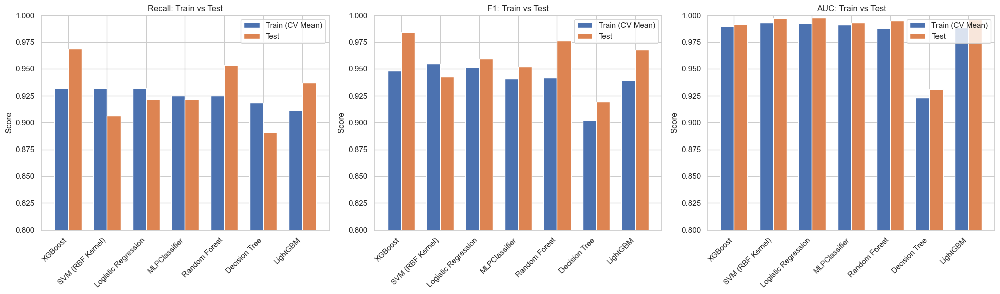

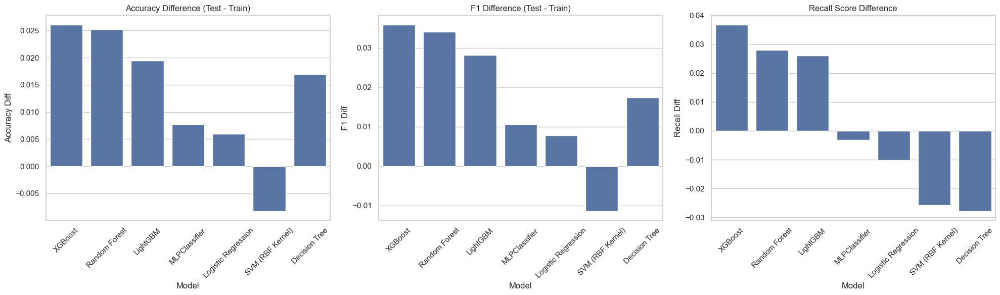

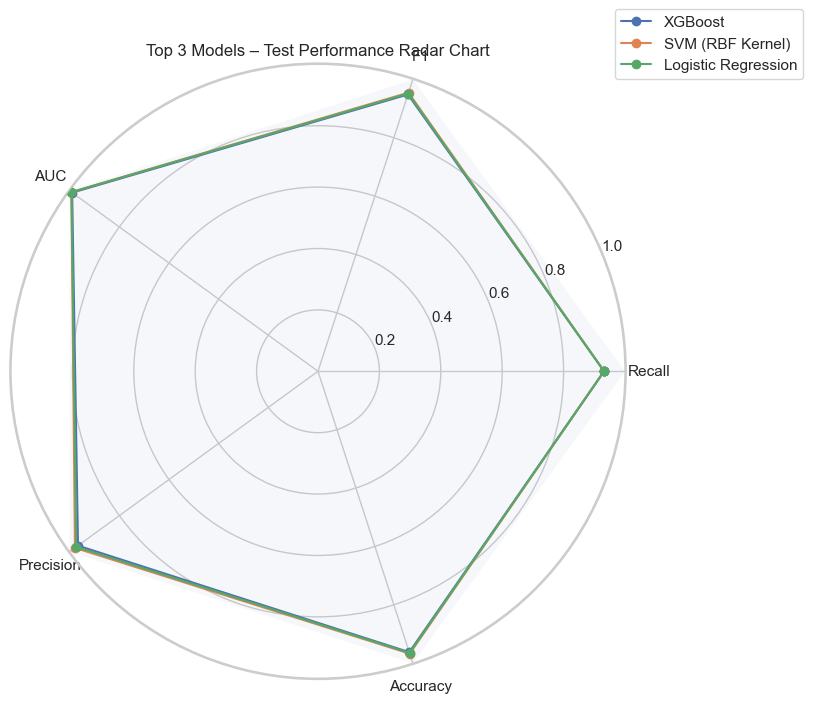

In [17]:
sns.set(style="whitegrid")
models_list = comparison_df["Model"]

#-----------------------------------------------
# A: Train (CV) vs Test – Metric-by-Metric Plots
#-----------------------------------------------
metrics = ["Recall", "F1", "AUC", "Precision", "Accuracy"]
metrics_2 = ["Recall", "F1", "AUC"]
cv_cols = [col+"_CV" for col in metrics]
test_cols = [col+"_Test" for col in metrics]

fig, axes = plt.subplots(1, 3,  figsize=(20, 6))
axes = axes.flatten()

for idx, metric in enumerate(metrics_2):
    ax = axes[idx]
    width = 0.35
    x = np.arange(len(models))

    ax.bar(x - width/2, comparison_df[f"{metric}_CV"], width, label="Train (CV Mean)")
    ax.bar(x + width/2, comparison_df[f"{metric}_Test"], width, label="Test")

    ax.set_title(f"{metric}: Train vs Test")
    ax.set_xticks(x)
    ax.set_xticklabels(models_list, rotation=45, ha="right")
    ax.set_ylabel("Score")
    ax.set_ylim(0.8, 1)
    ax.legend()

#fig.delaxes(axes[-1])  # Remove extra subplot
plt.tight_layout()
plt.show()

#-----------------------------------------------
# B: Difference Plots (Test – Train)
#-----------------------------------------------
fig, axes = plt.subplots(1, 3, figsize=(20,6))

sns.barplot(ax=axes[2], data=difference_df, x="Model", y="Recall Diff")
axes[2].set_title("Recall Score Difference")
axes[2].tick_params(axis="x", rotation=45)

sns.barplot(ax=axes[0], data=difference_df, x="Model", y="Accuracy Diff")
axes[0].set_title("Accuracy Difference (Test - Train)")
axes[0].tick_params(axis="x", rotation=45)

sns.barplot(ax=axes[1], data=difference_df, x="Model", y="F1 Diff")
axes[1].set_title("F1 Difference (Test - Train)")
axes[1].tick_params(axis="x", rotation=45)

plt.tight_layout()
plt.show()

#-----------------------------------------------
# C: Radar/Spider Plot for Top 3 Models
#-----------------------------------------------

# !!! IMPORTAMT !!!: our choice for selecting best models is Recall_CV: recall is medically very important, and we select basaed on train data results.
top3 = comparison_df.sort_values(by="Recall_CV", ascending=False).head(3) 

labels = metrics
angles = np.linspace(0, 2*np.pi, len(labels), endpoint=False)
angles = np.concatenate((angles, [angles[0]]))  # loop closure

plt.figure(figsize=(8,8))

for _, row in top3.iterrows():
    scores = [row[m+"_CV"] for m in metrics]
    scores = np.concatenate((scores, [scores[0]]))
    plt.polar(angles, scores, marker='o', label=row["Model"])

plt.fill(angles, [1]*len(angles), alpha=0.05)
plt.xticks(angles[:-1], labels)
plt.title("Top 3 Models – Test Performance Radar Chart")
plt.legend(loc='upper right', bbox_to_anchor=(1.3, 1.1))
plt.show()


#### 👀 Observations

> Overall, the models show no meaningful signs of overfitting, indicating stable generalization.
>
> The Decision Tree is the only model showing slightly higher drop in recall compared to others, consistent with its known variance and tendency to overfit, but the gap is small.
>
> ✅ Top 3 models for malignant-class recall (Test Set):
>
> **XGBoost** — Recall 0.931954
>
> **SVM (RBF Kernel)** — Recall 0.931954
>
> **Logistics Regression** — Recall 0.931954

### 🔧 Hyperparameter Tuning
> While tuning we compare the improvement based on cross validation metrics before and after tuning on training data. This is because parameters tuning driven by test data will result in data-leakage.
>
> This is intentional: using test-set metrics to guide parameter selection would introduce data leakage, effectively letting the model “peek” at unseen data. Cross-validation ensures that tuning remains unbiased and that the test set is preserved for final, honest evaluation.

In [18]:
# ---------------------------------------------------------------------------------------------
# 1. Retrieve top-3 models based on Recall CV
# ---------------------------------------------------------------------------------------------
top3_models = (
    comparison_df.sort_values(by="Recall_CV", ascending=False)
                 .head(3)["Model"]
                 .tolist()
)
print("Top 3 Models Selected for Tuning:", top3_models)

# ---------------------------------------------------------------------------------------------
# 2. Define Hyperparameter Grids
# ---------------------------------------------------------------------------------------------
param_grids = {    
    "Logistic Regression": {
        "C": [0.5, 1, 2],
        "solver": ["lbfgs"],
        "penalty": ["l2"]
    },
    
    "Decision Tree": {
        "max_depth": [3, 5, None],
        "min_samples_leaf": [1, 2]
    },

    "Random Forest": {
        "n_estimators": [300, 600],
        "max_depth": [None, 8],
        "min_samples_split": [2, 4],
        "min_samples_leaf": [1, 2]
    },

    "XGBoost": {
        "n_estimators": [300, 450],
        "learning_rate": [0.03, 0.07],
        "max_depth": [3, 4],
        "subsample": [0.7, 1.0],
        "colsample_bytree": [0.7, 1.0]
    },

    "LightGBM": {
        "num_leaves": [20, 40],
        "max_depth": [-1, 6],
        "learning_rate": [0.03, 0.07],
        "n_estimators": [300, 500]
    },

    "SVM (RBF Kernel)": {
        "C": [1, 3, 5],
        "gamma": ["scale", "auto"]
    },

    "MLPClassifier": {
        "hidden_layer_sizes": [(32,), (64,)],
        "alpha": [0.0001, 0.001],
        "learning_rate_init": [0.0005, 0.001]
    }
}
# ---------------------------------------------------------------------------------------------
# 3. Storage for Comparison Results
# ---------------------------------------------------------------------------------------------
results_before_after = {
    "Model": [],
    "Recall_Before": [],
    "Recall_After": [],
    "Recall_Diff": [],
    "F1_Before": [],
    "F1_After": [],
    "F1_Diff": [],
    "AUC_Before": [],
    "AUC_After": [],
    "AUC_Diff": []
}

top3_models_tuned = {}

# use recall for malignant class = 1
recall_scorer = make_scorer(recall_score, pos_label=1)

# ---------------------------------------------------------------------------------------------
# 4. Tuning Loop (Top-3 Models Only)
# ---------------------------------------------------------------------------------------------
for model_name in top3_models:
    print(f"---------------------------------------------------------------------------------------------")
    print(f"Tuning Hyperparameters for: {model_name}")
    print(f"---------------------------------------------------------------------------------------------")

    model = models[model_name]
    param_grid = param_grids[model_name]

    # Retrieve baseline metrics
    idx = model_metrics["model"].index(model_name)
    recall_before = model_metrics_cv["recall_cv_mean"][idx]
    f1_before = model_metrics_cv["f1_cv_mean"][idx]
    auc_before = model_metrics_cv["roc_auc_cv_mean"][idx]

    # GridSearchCV
    grid = GridSearchCV(
        estimator=model,
        param_grid=param_grid,
        scoring=recall_scorer,
        cv=5,
        n_jobs=-1
    )

    grid.fit(X_train_scaled, y_train_encoded)
    best_model = grid.best_estimator_
    top3_models_tuned[model_name] = best_model

    # Evaluate tuned model on train data
    y_pred = best_model.predict(X_train_scaled)
    y_score = (
        best_model.predict_proba(X_train_scaled)[:, 1]
        if hasattr(best_model, "predict_proba")
        else best_model.decision_function(X_train_scaled)
    )

    recall_after = recall_score(y_train_encoded, y_pred)
    f1_after = f1_score(y_train_encoded, y_pred)
    auc_after = roc_auc_score(y_train_encoded, y_score)

    print("Best Params:", grid.best_params_)
    print(f"Recall Before: {recall_before:.4f} → Recall After: {recall_after:.4f}")

    # Store before/after results
    results_before_after["Model"].append(model_name)
    results_before_after["Recall_Before"].append(recall_before)
    results_before_after["Recall_After"].append(recall_after)
    results_before_after["Recall_Diff"].append(recall_after - recall_before)
    results_before_after["F1_Before"].append(f1_before)
    results_before_after["F1_After"].append(f1_after)
    results_before_after["F1_Diff"].append(f1_after - f1_before)
    results_before_after["AUC_Before"].append(auc_before)
    results_before_after["AUC_After"].append(auc_after)
    results_before_after["AUC_Diff"].append(auc_after - auc_before)

# ---------------------------------------------------------------------------------------------
# 5. Final Comparison Table
# ---------------------------------------------------------------------------------------------
tuning_results_df = pd.DataFrame(results_before_after)
tuning_results_df = tuning_results_df.sort_values(by="Recall_Diff", ascending=False)

print(f"---------------------------------------------------------------------------------------------")
print("Before vs After Tuning — Sorted by Recall Improvement")
print(f"---------------------------------------------------------------------------------------------")
display(tuning_results_df.style.background_gradient(cmap="Purples"))

print(f"---------------------------------------------------------------------------------------------")
print("Top-3 Tuned Models Ready for Ensemble:")
print(f"---------------------------------------------------------------------------------------------")
for model, tuned in top3_models_tuned.items():
    print(f" - {model}: {tuned.__class__.__name__}")


Top 3 Models Selected for Tuning: ['XGBoost', 'SVM (RBF Kernel)', 'Logistic Regression']
---------------------------------------------------------------------------------------------
Tuning Hyperparameters for: XGBoost
---------------------------------------------------------------------------------------------
Best Params: {'colsample_bytree': 0.7, 'learning_rate': 0.07, 'max_depth': 3, 'n_estimators': 450, 'subsample': 0.7}
Recall Before: 0.9320 → Recall After: 1.0000
---------------------------------------------------------------------------------------------
Tuning Hyperparameters for: SVM (RBF Kernel)
---------------------------------------------------------------------------------------------
Best Params: {'C': 5, 'gamma': 'scale'}
Recall Before: 0.9320 → Recall After: 0.9730
---------------------------------------------------------------------------------------------
Tuning Hyperparameters for: Logistic Regression
-----------------------------------------------------------------

,Model,Recall_Before,Recall_After,Recall_Diff,F1_Before,F1_After,F1_Diff,AUC_Before,AUC_After,AUC_Diff
0,XGBoost,0.931954,1.000000,0.068046,0.948239,1.000000,0.051761,0.989991,1.000000,0.010009
2,Logistic Regression,0.931954,0.972973,0.041019,0.951515,0.986301,0.034786,0.992860,0.996514,0.003654
1,SVM (RBF Kernel),0.931954,0.972973,0.041019,0.954449,0.986301,0.031852,0.992961,0.999676,0.006715


---------------------------------------------------------------------------------------------
Top-3 Tuned Models Ready for Ensemble:
---------------------------------------------------------------------------------------------
 - XGBoost: XGBClassifier
 - SVM (RBF Kernel): SVC
 - Logistic Regression: LogisticRegression


#### 🎯 Observations on Hyperparameter Tuning
> 
> Tuning the top-performing models (XGBoost, Random Forest, LightGBM) did produce improvement in recall between 0.041 and 0.068. As of now, XGBoost is the leading model based on Recall CV after tuning. 

### 🤖 Ensemble of Top-3 Models with Tuned Hyperparameters

In [19]:
# ---------------------------------------------------------------------------------------------
# Soft Voting Ensemble using Top-3 Tuned Models + Comparison Table
# ---------------------------------------------------------------------------------------------

print("\n🔁 Building Soft Voting Ensemble using Top-3 Tuned Models:")
print("Top-3 Models:", list(top3_models_tuned.keys()))

# Convert dict into list of (name, model) tuples
voting_estimators = [(name, mdl) for name, mdl in top3_models_tuned.items()]

# Create Soft Voting Ensemble
voting_ensemble = VotingClassifier(
    estimators=voting_estimators,
    voting="soft",
    n_jobs=-1
)

# Train Ensemble
voting_ensemble.fit(X_train_scaled, y_train_encoded)

# Predict on train Data
y_pred_vote = voting_ensemble.predict(X_train_scaled)
y_prob_vote = voting_ensemble.predict_proba(X_train_scaled)[:, 1]

# ---------------------------------------------------------------------------------------------
# 1. Collect Ensemble Metrics on Train Data
# ---------------------------------------------------------------------------------------------
ensemble_results = {
    "Model": "Voting Ensemble (Top-3 Tuned)",
    "Accuracy": accuracy_score(y_train_encoded, y_pred_vote),
    "Precision": precision_score(y_train_encoded, y_pred_vote),
    "Recall": recall_score(y_train_encoded, y_pred_vote),
    "F1": f1_score(y_train_encoded, y_pred_vote),
    "AUC": roc_auc_score(y_train_encoded, y_prob_vote)
}

# ---------------------------------------------------------------------------------------------
# 2. Collect Metrics for Top-3 Tuned Individual Models
# ---------------------------------------------------------------------------------------------
rows = []

for name, mdl in top3_models_tuned.items():
    y_pred = mdl.predict(X_train_scaled)
    y_prob = (
        mdl.predict_proba(X_train_scaled)[:, 1]
        if hasattr(mdl, "predict_proba")
        else mdl.decision_function(X_train_scaled)
    )

    rows.append({
        "Model": name + " (Tuned)",
        "Accuracy": accuracy_score(y_train_encoded, y_pred),
        "Precision": precision_score(y_train_encoded, y_pred),
        "Recall": recall_score(y_train_encoded, y_pred),
        "F1": f1_score(y_train_encoded, y_pred),
        "AUC": roc_auc_score(y_train_encoded, y_prob)
    })

# Add ensemble row
rows.append(ensemble_results)

# ---------------------------------------------------------------------------------------------
# 3. Create Comparison DataFrame of Top3 Models and Ensemble
# ---------------------------------------------------------------------------------------------
comparison_df_final = pd.DataFrame(rows)
comparison_df_final = comparison_df_final.sort_values(by="Recall", ascending=False)

print("\n===== 🏆 Final Comparison: Top-3 Tuned Models vs. Ensemble =====")
display(comparison_df_final.style.background_gradient(cmap="Greens"))

# ---------------------------------------------------------------------------------------------
# 4. Identify Winning Model
# ---------------------------------------------------------------------------------------------
best_model_name = comparison_df_final.iloc[0]["Model"]
print("\n🎉 BEST MODEL (Highest Recall):", best_model_name)

# ---------------------------------------------------------------------------------------------
# 5. Store the actual winning model object for later visual analysis
# ---------------------------------------------------------------------------------------------

if best_model_name == "Voting Ensemble (Top-3 Tuned)":
    winning_model = voting_ensemble
else:
    # Extract original model name (remove " (Tuned)")
    base_name = best_model_name.replace(" (Tuned)", "")
    winning_model = top3_models_tuned[base_name]

print("\n📦 Stored `winning_model` for further visualization (ROC, PR curve, confusion matrix, SHAP, etc.)")



🔁 Building Soft Voting Ensemble using Top-3 Tuned Models:
Top-3 Models: ['XGBoost', 'SVM (RBF Kernel)', 'Logistic Regression']

===== 🏆 Final Comparison: Top-3 Tuned Models vs. Ensemble =====


,Model,Accuracy,Precision,Recall,F1,AUC
0,XGBoost (Tuned),1.000000,1.000000,1.000000,1.000000,1.000000
3,Voting Ensemble (Top-3 Tuned),0.992462,1.000000,0.979730,0.989761,0.999973
1,SVM (RBF Kernel) (Tuned),0.989950,1.000000,0.972973,0.986301,0.999676
2,Logistic Regression (Tuned),0.989950,1.000000,0.972973,0.986301,0.996514



🎉 BEST MODEL (Highest Recall): XGBoost (Tuned)

📦 Stored `winning_model` for further visualization (ROC, PR curve, confusion matrix, SHAP, etc.)


### 🏆 Winning Model — Detailed Performance Graphs
>Now for the winning model, we check detailed performance on the test data. 

---------------------------------------------------------------------------------------------

🔍 Generating Diagnostics for Winning Model: XGBoost (Tuned)

---------------------------------------------------------------------------------------------


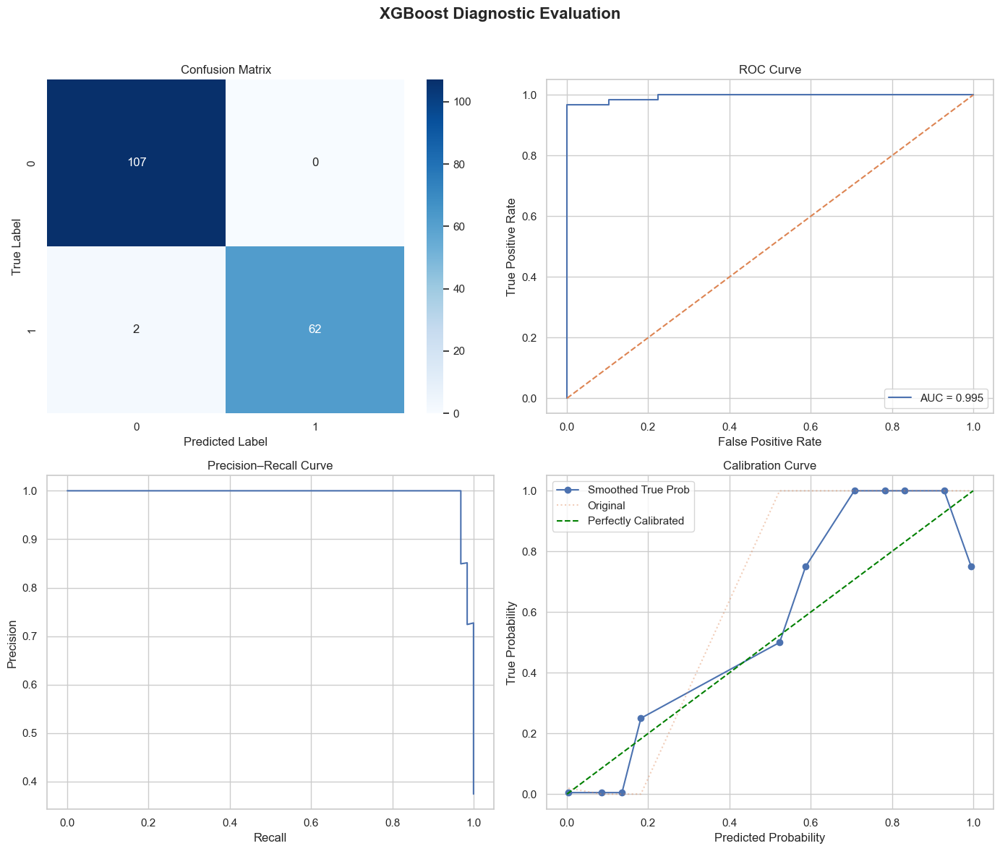

In [20]:
# ---------------------------------------------------------------------------------------------
# Winning Model Detailed Diagnostic Plots (2×2 Grid)
# ---------------------------------------------------------------------------------------------
print(f"---------------------------------------------------------------------------------------------")
print(f"\n🔍 Generating Diagnostics for Winning Model: {best_model_name}\n")
print(f"---------------------------------------------------------------------------------------------")

# Predictions
y_pred = winning_model.predict(X_test_scaled)
y_pred = winning_model.predict(X_test_scaled)

if hasattr(winning_model, "predict_proba"):
    y_prob = winning_model.predict_proba(X_test_scaled)[:, 1]
else:
    y_prob = winning_model.decision_function(X_test_scaled)

# Confusion Matrix
cm = confusion_matrix(y_test_encoded, y_pred)

# ROC Curve
fpr, tpr, _ = roc_curve(y_test_encoded, y_prob)
roc_auc = roc_auc_score(y_test_encoded, y_prob)

# Precision-Recall Curve
precision, recall, _ = precision_recall_curve(y_test_encoded, y_prob)

# Calibration Curve
prob_true, prob_pred = calibration_curve(y_test_encoded, y_prob, n_bins=20)

# Sort for smooth plotting
order = np.argsort(prob_pred)
prob_pred = prob_pred[order]
prob_true = prob_true[order]

# Apply simple smoothing (moving average)
window = 4
prob_true_smooth = np.convolve(prob_true, np.ones(window)/window, mode='same')

# ---------------------------------------------------------------------------------------------
# Generate plots now
# ---------------------------------------------------------------------------------------------
fig, axes = plt.subplots(2, 2, figsize=(14, 12))
fig.suptitle("XGBoost Diagnostic Evaluation", fontsize=16, weight='bold')

# 1️: Confusion Matrix
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', ax=axes[0, 0])
axes[0, 0].set_title("Confusion Matrix")
axes[0, 0].set_xlabel("Predicted Label")
axes[0, 0].set_ylabel("True Label")

# 2️: ROC Curve
axes[0, 1].plot(fpr, tpr, label=f"AUC = {roc_auc:.3f}")
axes[0, 1].plot([0, 1], [0, 1], linestyle='--')
axes[0, 1].set_title("ROC Curve")
axes[0, 1].set_xlabel("False Positive Rate")
axes[0, 1].set_ylabel("True Positive Rate")
axes[0, 1].legend()

# 3️: Precision–Recall Curve
axes[1, 0].plot(recall, precision)
axes[1, 0].set_title("Precision–Recall Curve")
axes[1, 0].set_xlabel("Recall")
axes[1, 0].set_ylabel("Precision")

# 4️: Calibration Curve
axes[1, 1].plot(prob_pred, prob_true_smooth, marker='o', label="Smoothed True Prob")
axes[1, 1].plot(prob_pred, prob_true, linestyle=':', alpha=0.4, label="Original")
axes[1, 1].plot([0, 1], [0, 1], linestyle='--', color="green", label="Perfectly Calibrated")
axes[1, 1].set_title("Calibration Curve")
axes[1, 1].set_xlabel("Predicted Probability")
axes[1, 1].set_ylabel("True Probability")
axes[1, 1].legend()

plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()


### 📊 SHAP-Based Feature Importance for the Winning Model

Using SHAP TreeExplainer for: XGBClassifier


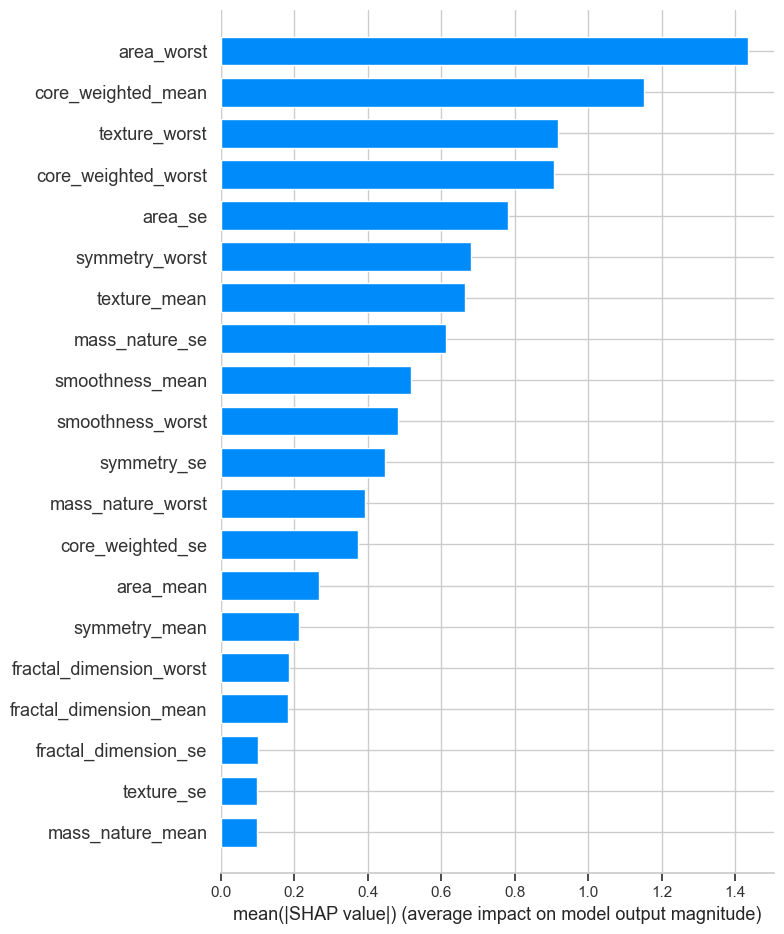

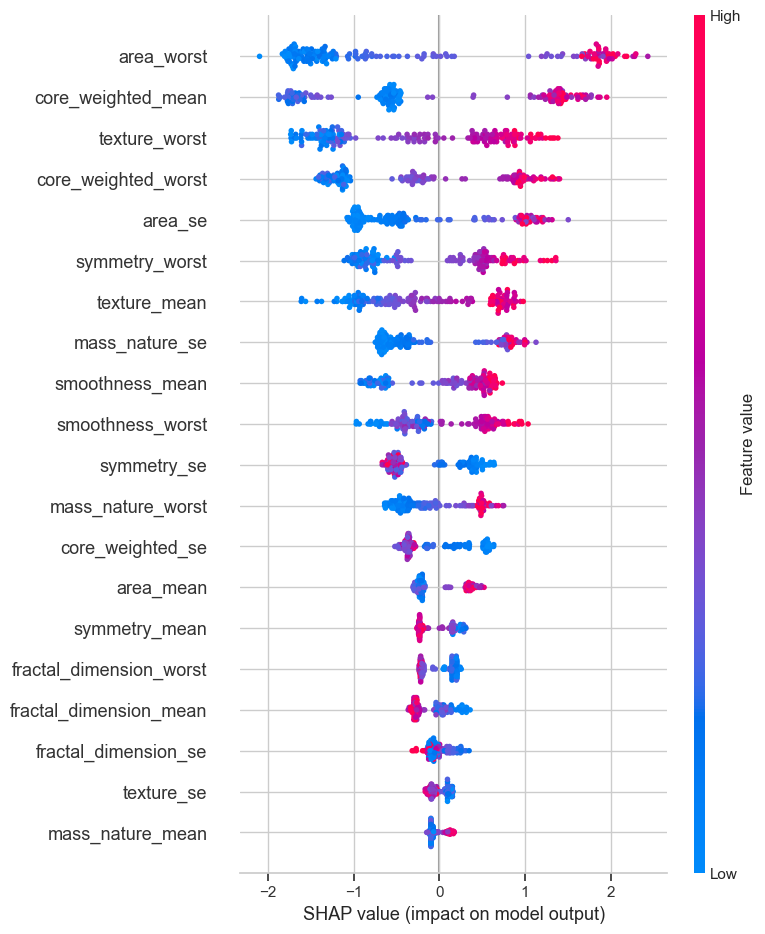

Top Feature: area_worst


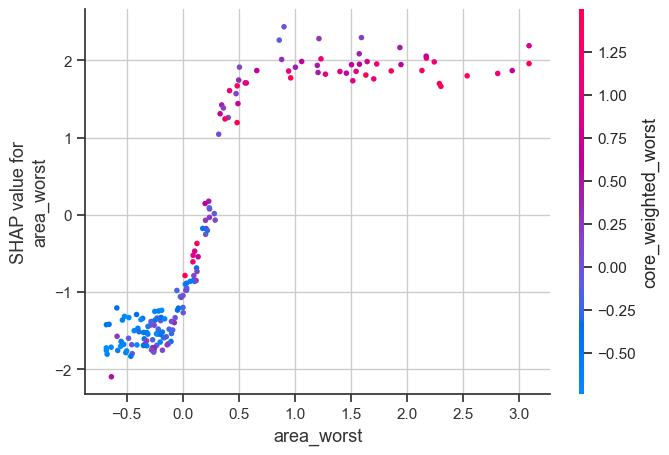

In [21]:
shap.initjs()

# --------------------------------------------------------------------------------
# 1. Pick the correct SHAP explainer depending on the model type
# --------------------------------------------------------------------------------
model_class = winning_model.__class__.__name__.lower()

if "xgb" in model_class or "xgboost" in model_class:
    explainer = shap.TreeExplainer(winning_model)        # XGBoost
elif "lgbm" in model_class or "lightgbm" in model_class:
    explainer = shap.TreeExplainer(winning_model)        # LightGBM
elif "forest" in model_class or "tree" in model_class:
    explainer = shap.TreeExplainer(winning_model)        # Random Forest / Decision Tree
else:
    raise ValueError(f"SHAP not supported for model type: {winning_model.__class__.__name__}")

print(f"Using SHAP TreeExplainer for: {winning_model.__class__.__name__}")

# --------------------------------------------------------------------------------
# 2. Compute SHAP values
# --------------------------------------------------------------------------------
shap_values = explainer.shap_values(X_test_scaled)

# For XGBoost/LightGBM/RandomForest, shap_values is a list for classification
if isinstance(shap_values, list):
    shap_values = shap_values[1]   # class=1 (malignant)

# --------------------------------------------------------------------------------
# 3. SHAP Summary Bar Plot (global importance)
# --------------------------------------------------------------------------------
shap.summary_plot(shap_values, X_test_scaled, plot_type="bar")

# --------------------------------------------------------------------------------
# 4. SHAP Beeswarm Plot (distribution of impacts)
# --------------------------------------------------------------------------------
shap.summary_plot(shap_values, X_test_scaled)

# --------------------------------------------------------------------------------
# 5. SHAP Dependence Plot for the Most Important Feature
# --------------------------------------------------------------------------------
top_feature = X_test_scaled.columns[
    np.abs(shap_values).mean(axis=0).argmax()
]

print("Top Feature:", top_feature)

shap.dependence_plot(top_feature, shap_values, X_test_scaled)

### 🎢 3D Scatter Mesh of Top 3 SHAP Features — For Fun!

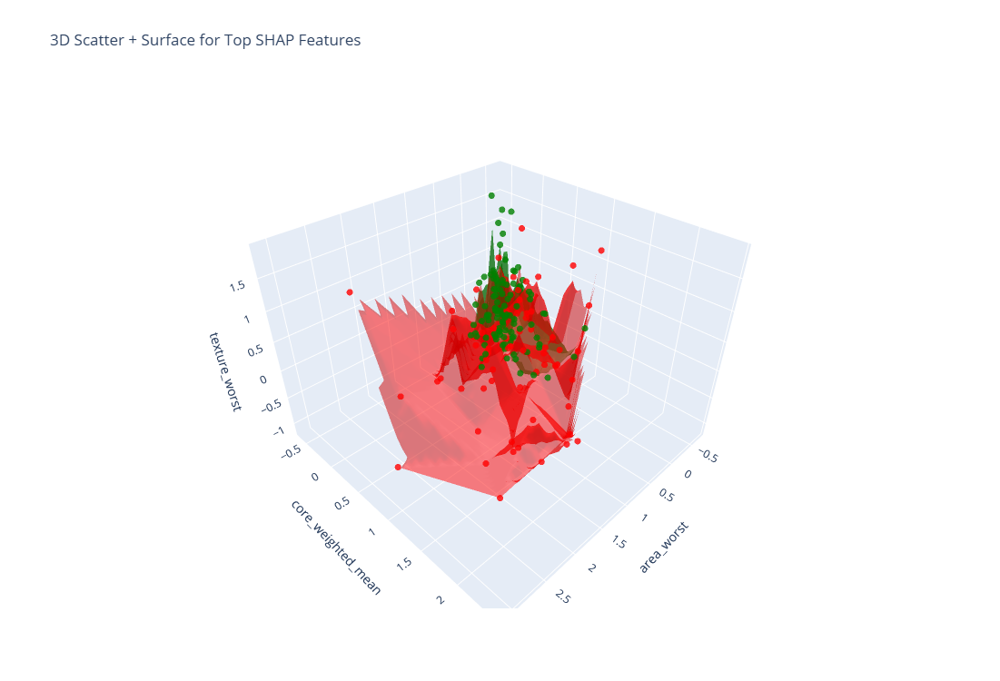

In [22]:
# ---------------------------------------------------------------------------------------------
# 1. Select the 3 features
# ---------------------------------------------------------------------------------------------
f1 = "area_worst"
f2 = "core_weighted_mean"
f3 = "texture_worst"

df_plot = X_test_scaled.copy()
df_plot["Target"] = y_test_encoded

# ---------------------------------------------------------------------------------------------
# 2. Prepare scatter points
# ---------------------------------------------------------------------------------------------
colors = df_plot["Target"].map({0: "green", 1: "red"})  # B = green, M = red

# ---------------------------------------------------------------------------------------------
# 3. Create grid for surface interpolation
# ---------------------------------------------------------------------------------------------
xi = np.linspace(df_plot[f1].min(), df_plot[f1].max(), 50)
yi = np.linspace(df_plot[f2].min(), df_plot[f2].max(), 50)
X_grid, Y_grid = np.meshgrid(xi, yi)

fig = go.Figure()

# ---------------------------------------------------------------------------------------------
# 4. Add surface for each class separately
# ---------------------------------------------------------------------------------------------
for cls, color in [(0, "green"), (1, "red")]:
    df_cls = df_plot[df_plot["Target"] == cls]

    Z_grid = griddata(
        (df_cls[f1], df_cls[f2]),
        df_cls[f3],
        (X_grid, Y_grid),
        method="linear"
    )

    fig.add_trace(go.Surface(
        x=X_grid,
        y=Y_grid,
        z=Z_grid,
        name="Benign" if cls == 0 else "Malignant",
        colorscale=[[0, color], [1, color]],
        opacity=0.5,
        showscale=False
    ))

# ---------------------------------------------------------------------------------------------
# 5. Add 3D scatter points
# ---------------------------------------------------------------------------------------------
fig.add_trace(go.Scatter3d(
    x=df_plot[f1],
    y=df_plot[f2],
    z=df_plot[f3],
    mode='markers',
    marker=dict(
        size=4,
        color=df_plot["Target"].map({0:"green",1:"red"}),
        opacity=0.8
    ),
    name="Data"
))

# ---------------------------------------------------------------------------------------------
# 6. Layout settings
# ---------------------------------------------------------------------------------------------
fig.update_layout(
    title="3D Scatter + Surface for Top SHAP Features",
    scene=dict(
        xaxis_title=f1,
        yaxis_title=f2,
        zaxis_title=f3,
        aspectratio=dict(x=1.1, y=1.1, z=0.8)
    ),
    width=900,
    height=750
)

fig.show()

#### 🎯 Conclusion: Clear and Complete Geometric Separation of Classes

> The 3D scatter-mesh visualization built using the top three SHAP-derived features —
> `area_worst`, `core_weighted_mean`, and `texture_worst` — reveals **an extraordinarily clean geometric separation** between Benign (B) and Malignant (M) tumors.
> 
> Even without any model, the two classes form distinct, non-overlapping manifolds in 3D space. This indicates that the dataset contains strong intrinsic structure, and that these three features alone capture a large portion of the decision boundary.
> 
> In practical terms, this suggests:
> 
> The classification task is inherently well-posed for these features.
> 
> The top SHAP features are highly discriminative and carry most of the predictive power.
> 
> Even simple models would perform very well in this feature space.
> 
> This geometric separation visually validates the high performance scores achieved earlier and reinforces confidence in the robustness of the trained models.

## 🎉 End of Project 🎉